<a href="https://colab.research.google.com/github/arthurvaz05/Python.Script/blob/master/Coronavirus.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Downloads de pacotes

In [0]:
!python -m pip install hana_ml

In [0]:
!pip install geopandas

In [0]:
pip install lmfit

In [0]:
pip install pytrends

# Referências

In [0]:
#https://towardsdatascience.com/tracking-coronavirus-engagement-with-google-trends-in-python-5a4b08bc6977
#https://github.com/CSSEGISandData/COVID-19/blob/master/README.md
#https://blogs.sap.com/2020/03/11/quickly-load-covid-19-data-with-hana_ml-and-see-with-dbeaver/
#https://image.online-convert.com/convert/html-to-jpg
#http://data.stats.gov.cn/english/easyquery.htm?cn=E0103
#http://www.stats.gov.cn/tjsj/ndsj/2018/indexeh.htm
#https://www.worldatlas.com/articles/chinese-provinces-by-population.html
#https://www.aljazeera.com/news/2020/01/timeline-china-coronavirus-spread-200126061554884.html
#https://github.com/Osvaldo1982/projetos/blob/master/0001_epidemic_models_covid19/Modelo%20SIR.ipynb
#https://towardsdatascience.com/modelling-the-coronavirus-epidemic-spreading-in-a-city-with-python-babd14d82fa2
#https://www.businessinsider.com/coronavirus-incubation-period-5-days-average-can-exceed-2-weeks-2020-3
#https://www.livescience.com/coronavirus-myths.html
#https://www.ijidonline.com/article/S1201-9712(20)30117-X/fulltext
#https://www.gfmag.com/global-data/non-economic-data/best-tech-countries
#https://lmfit-py.readthedocs.io/en/0.9.0/builtin_models.html
#https://scikit-learn.org/stable/modules/linear_model.html
#https://robinlombaert.github.io/ComboCode/ComboCode.cc.ivs.sigproc.lmfit.utilfuncs-pysrc.html

# Instalação de bibliotecas

In [0]:
from pytrends.request import TrendReq
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import hana_ml, pandas
import fix_yahoo_finance as yf
import datetime
from datetime import date
import numpy as np
import datetime
import sklearn.gaussian_process as gp
from scipy.integrate import odeint

In [0]:
from google.colab import drive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
import os
from PIL import Image
import glob
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import geopandas as gpd
from bokeh.io import output_notebook, show, output_file, save
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar
from bokeh.palettes import brewer
from bokeh.plotting import figure, output_file
import json
import matplotlib.patches as mpatches
from sklearn.cluster import KMeans

# Habilitar acesso Drive

In [0]:
drive.mount('/content/drive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive/


# índice dos mercados 

Foi escolhido os principais índices pelo mundo, para medir a resposta do Coronavírus e o início da crise da epidemia em 2020.


*   BVSP: Bovespa
*   DJI: Dow Jones
*   FTSE: UK
*   HSI: Hang Seng
*   KS11: Korea







In [237]:
#Carrega os índices desde Jan 01 até a data vigente
stocks = ["^BVSP","^DJI","^FTSE","^HSI","^KS11"]
start = datetime.datetime(2020,1,1)
end = date.today()
data = yf.download(stocks, start=start, end=end)

[*********************100%***********************]  5 of 5 downloaded


In [0]:
#Selecionar o fechamento ajustado
close = data['Adj Close']
close = pd.DataFrame(close)
#Calcular o percentual
close_perc = close/close.shift()-1
#Substituir os nan por zero
close_perc.fillna(0,inplace=True)
#DICIONARIO
legenda_stocks = {"^BVSP": "IBOVESPA", "^DJI": "DOW JONES", "^FTSE":"Bolsa de Valores de Londres", "^HSI":"Hang Seng", "^KS11":"Bolsa de Valores de Korea"}
close_perc.columns = close_perc.columns.map(lambda x: legenda_stocks[x])

<Figure size 1440x720 with 0 Axes>

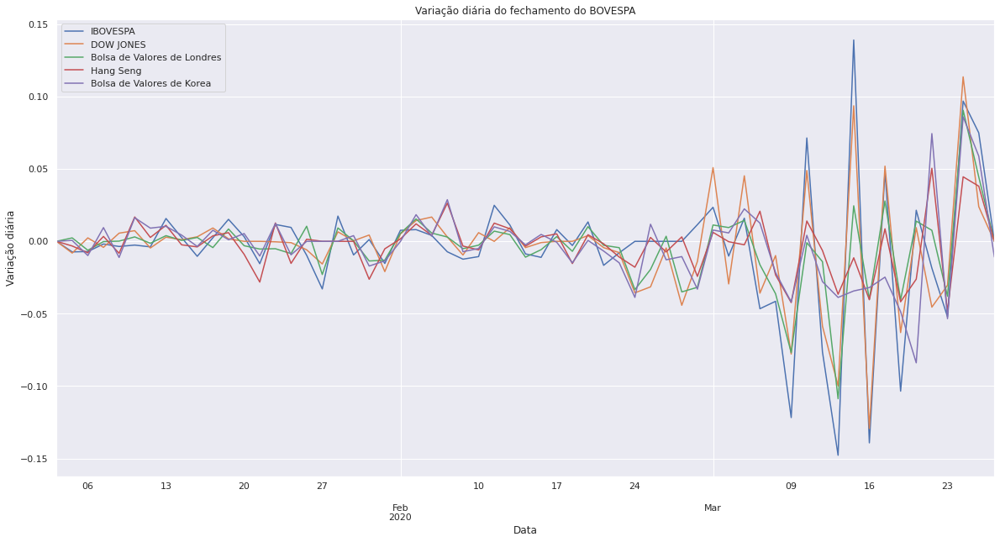

In [239]:
#Mostrar a variação no tempo dos índices selecionados
fig = plt.gcf()
plt.rcParams["figure.figsize"] = (20,10)
close_perc.plot(kind='line')
plt.title("Variação diária do fechamento do BOVESPA")
plt.ylabel("Variação diária")
plt.xlabel("Data")
plt.show()

In [0]:
#Salvar o caminho do diretório para salvar
output_path = '/content/drive/My Drive/Coronavirus/Gif_indice_I'
#Selecionar as datas que constam no dataframe
datas = close_perc.index
#Transpor o dataframe
close_perc2 = close_perc.transpose()

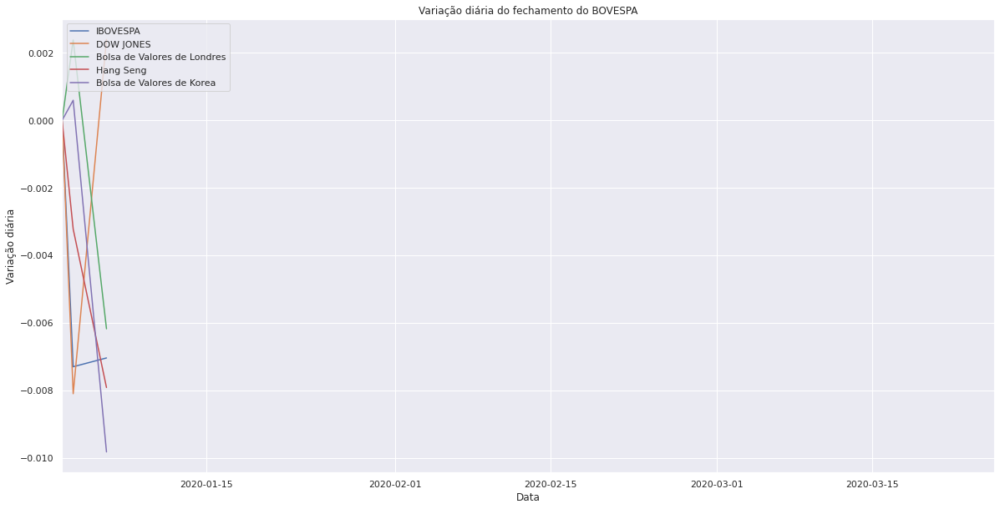

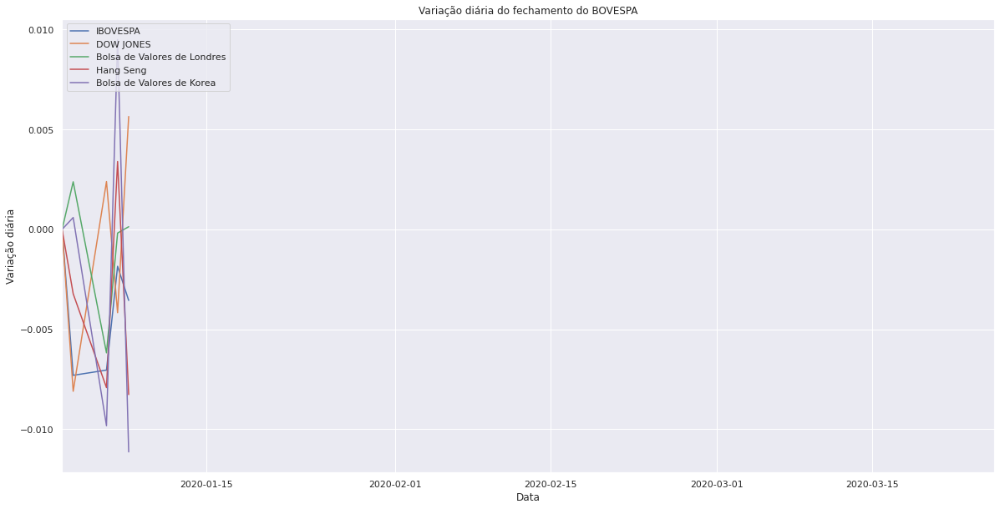

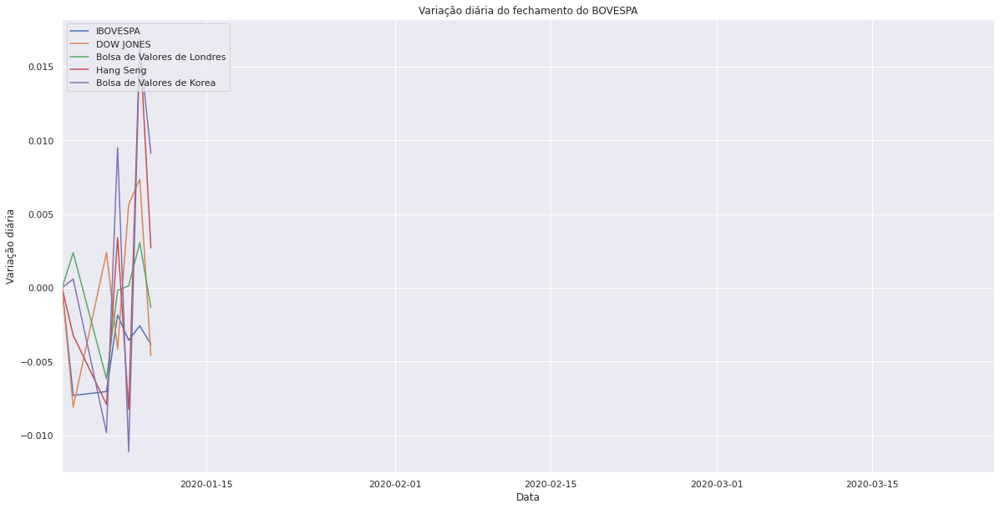

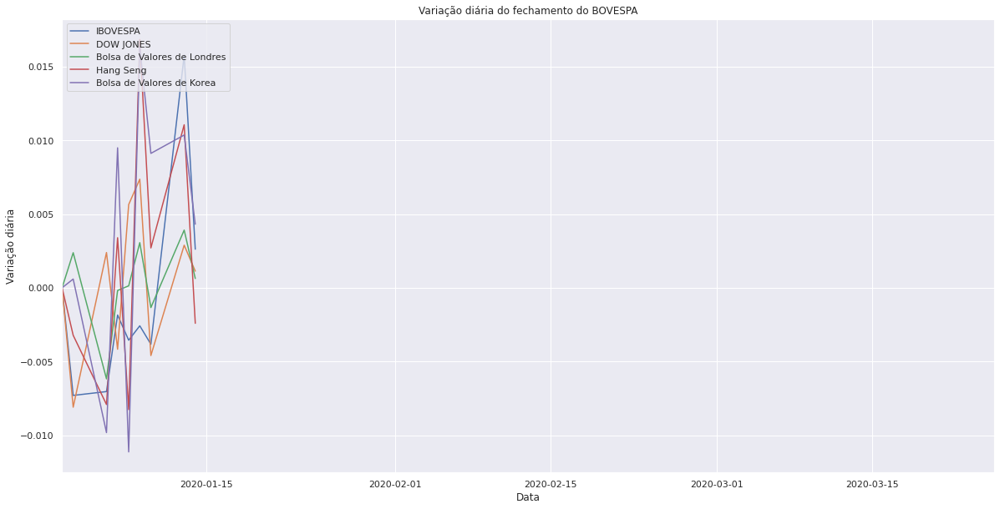

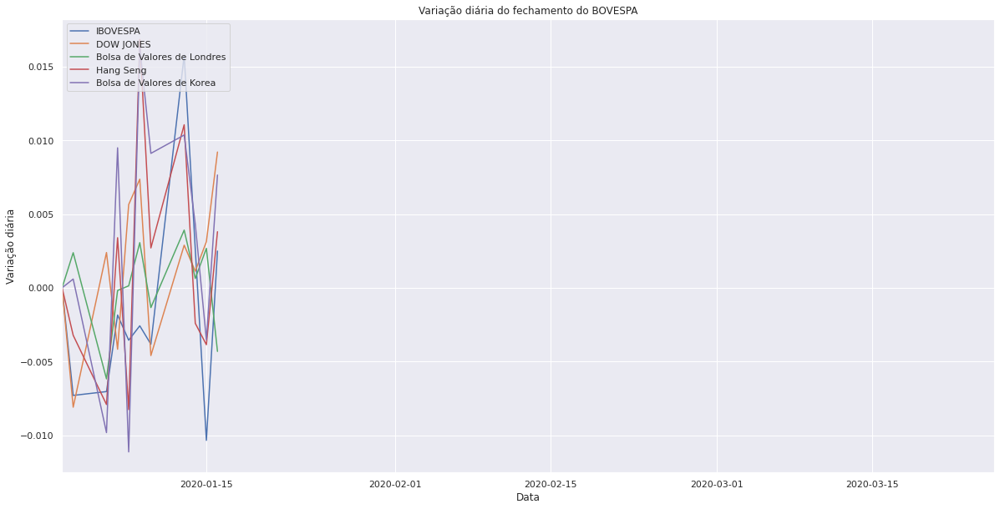

...

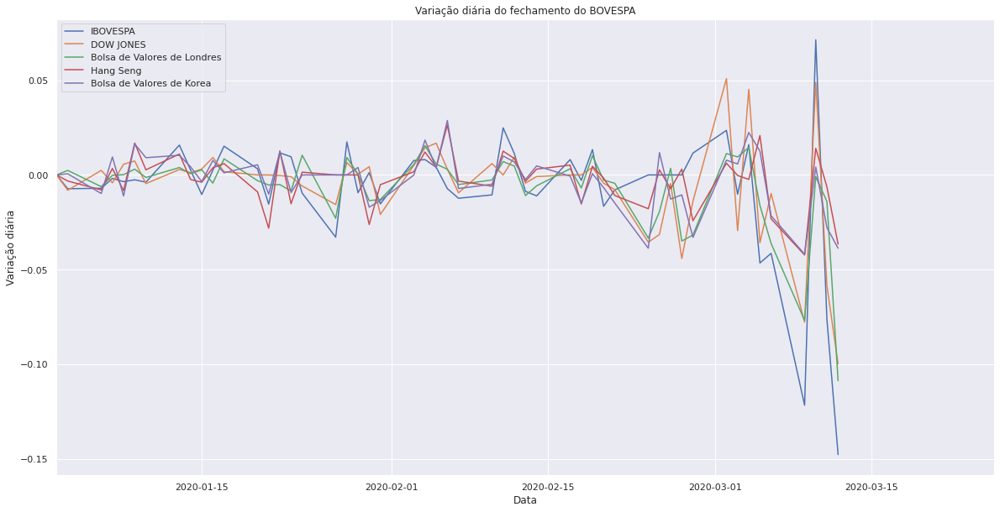

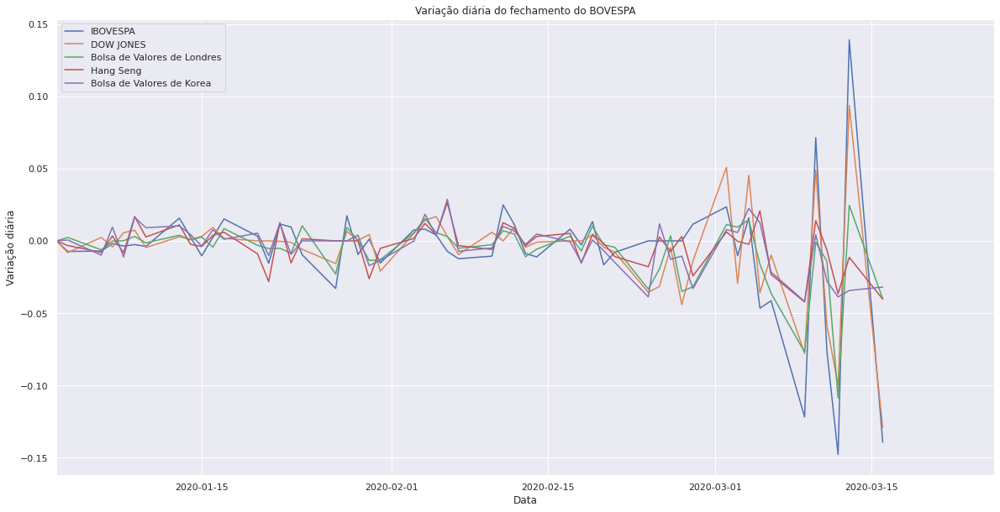

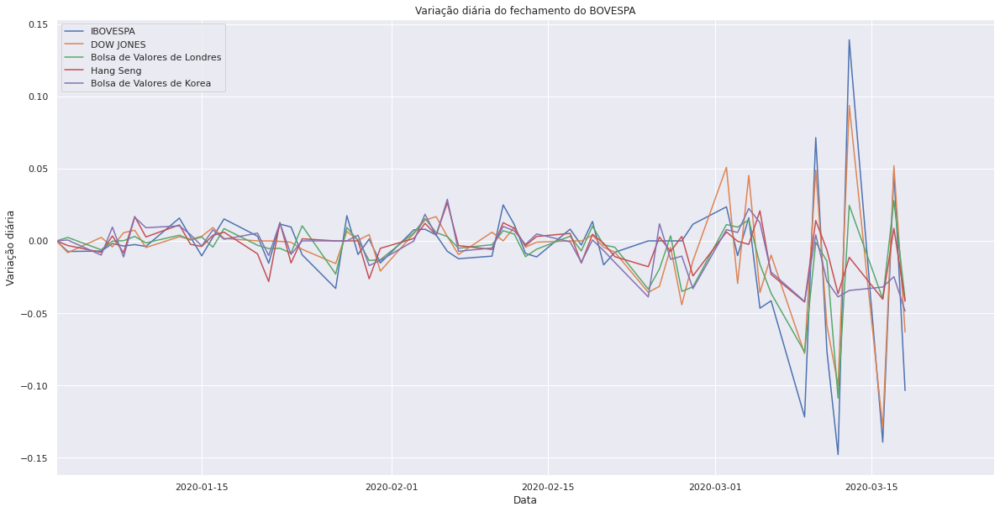

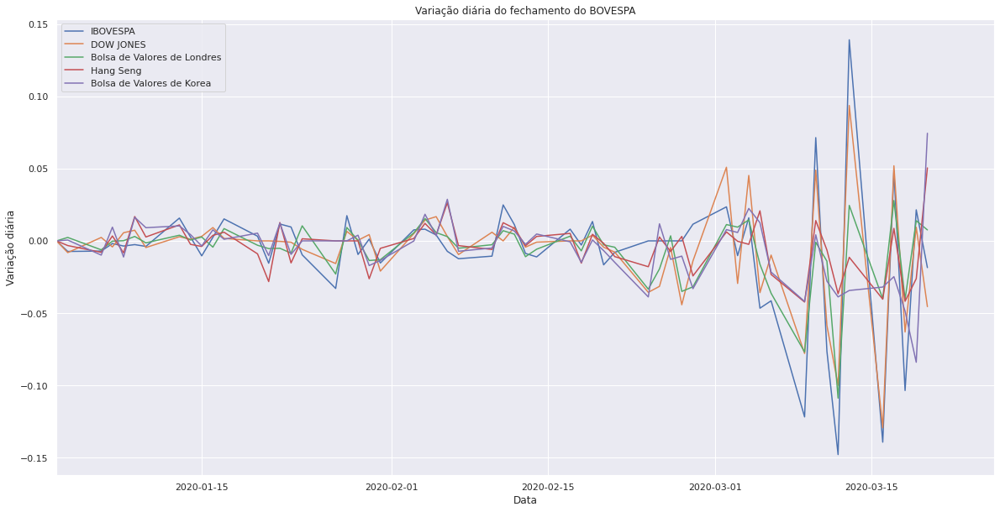

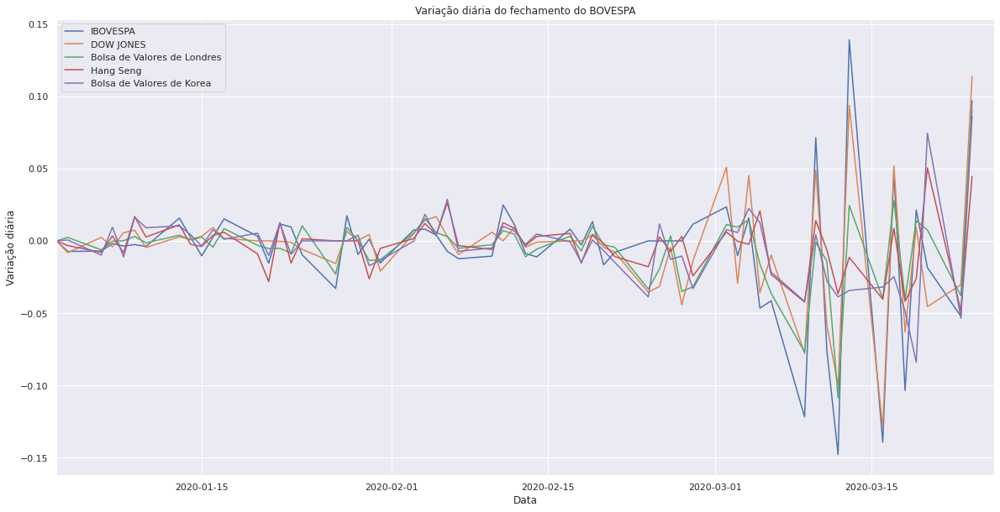

In [241]:
#Salvar cada gráfico para cada data no dataframe, afim de montar o GIF mostrando a evolução em 2020
for i in range(3,len(datas),2):
  teste = close_perc2.iloc[:,0:i]
  teste2 = close_perc2.iloc[:,range(i+1,len(close_perc2.columns))]
  teste2 = teste2.transpose()
  teste2 = teste2.applymap(lambda x: np.nan)
  teste = teste.transpose()
  teste3 = teste.append(teste2)
  fig = plt.gcf()
  plt.rcParams["figure.figsize"] = (20,10)
  plt.plot(teste3.index,teste3)
  axes = plt.gca()
  axes.set_xlim([min(teste3.index),max(teste3.index)])
  axes.legend(teste3.columns,loc='upper left', frameon=True)
  plt.title("Variação diária do fechamento do BOVESPA")
  plt.ylabel("Variação diária")
  plt.xlabel("Data")
  plt.show()
  filepath = os.path.join(output_path, str(i)+'_indice.jpg')
  fig.savefig(filepath)

In [0]:
#Abrir os gráfico salvos e compactar para montar o GIF
frames = []
imgs = glob.glob("/content/drive/My Drive/Coronavirus/Gif_indice_I/*.jpg")
for i in imgs:
    new_frame = Image.open(i)
    frames.append(new_frame)

frames[0].save('/content/drive/My Drive/Coronavirus/Gif_indice_I/jpg_to_gif.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=500, loop=0)

In [0]:
#Mostrar a variação do fechamento ajustado dos índices comparado com o preço do começo de Janeiro
d014 = (np.array(close.loc[close.index > '2020-01-02',:])/np.array(close.loc[close.index == '2020-01-02',:]))-1
d014 = pd.DataFrame(d014)
d014.rename(columns = {0:'IBOVESPA', 1:'DOW JONES', 
                              2:'Bolsa de Valores de Londres', 3:'Hang Seng', 4:'Bolsa de Valores de Korea'}, inplace = True)
d014 = d014.set_index(close.iloc[1:len(close),:].index)
#retiranar os dias nan com um corte de 1 nan
datas = d014.index
#Transpor o dataframe
d014 = d014.transpose()
d014 = d014.dropna(axis=1)

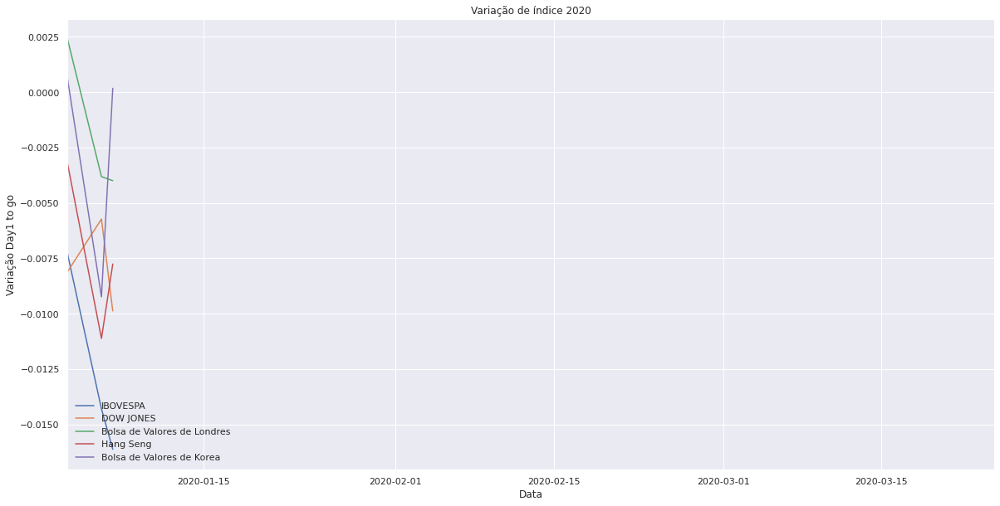

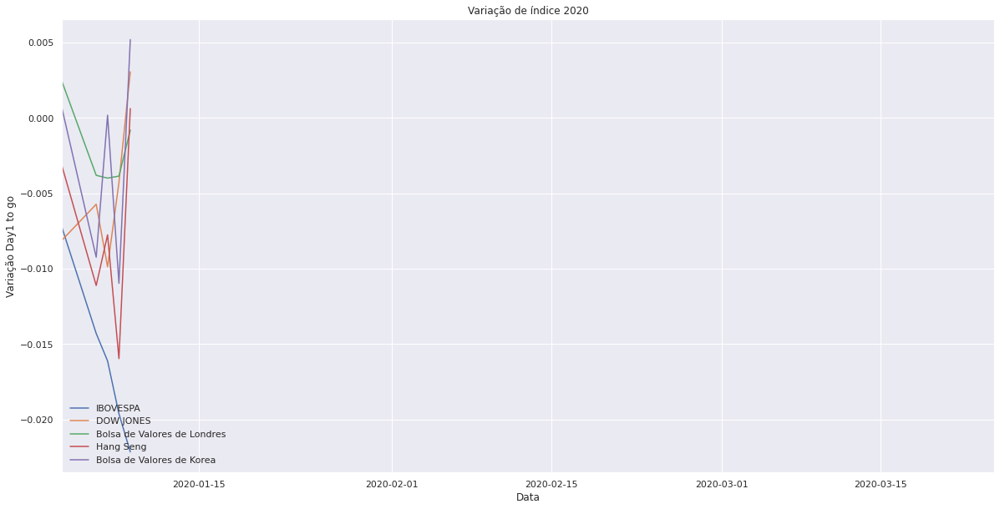

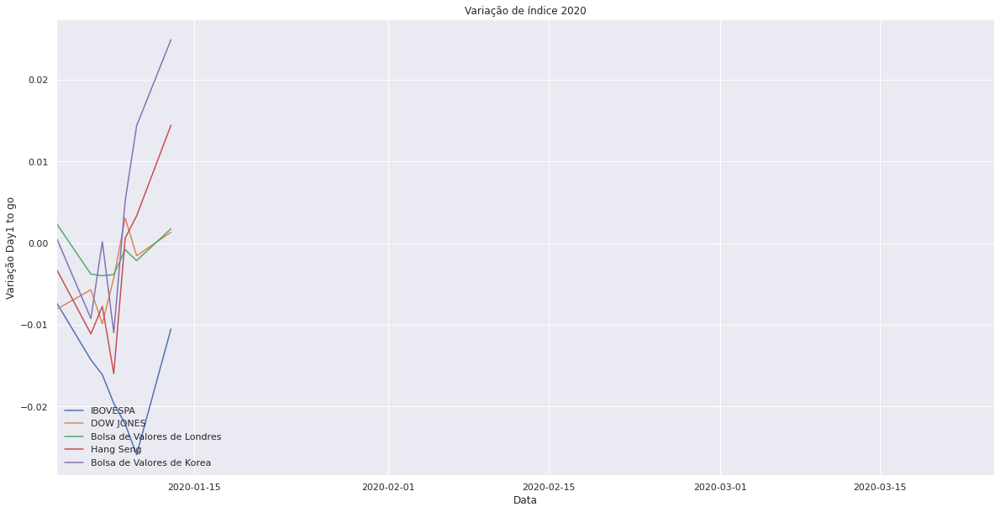

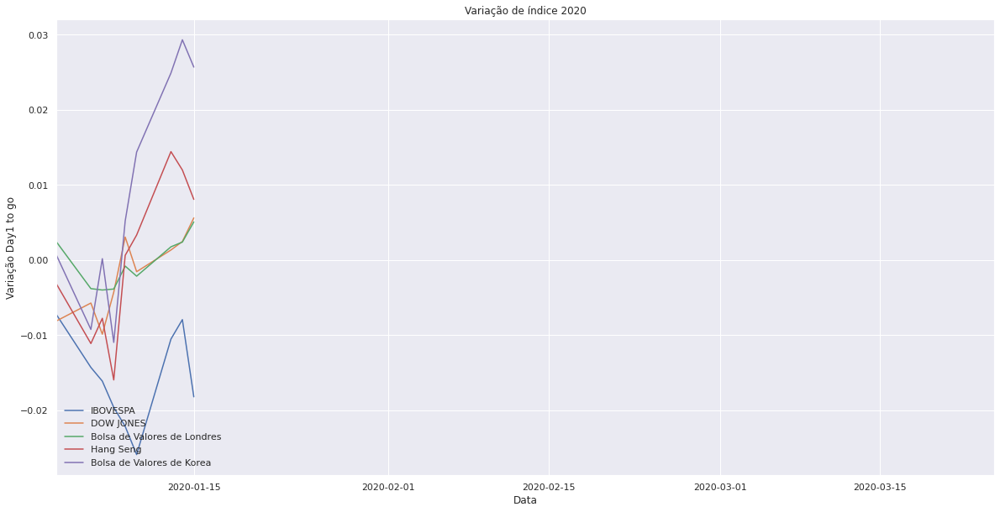

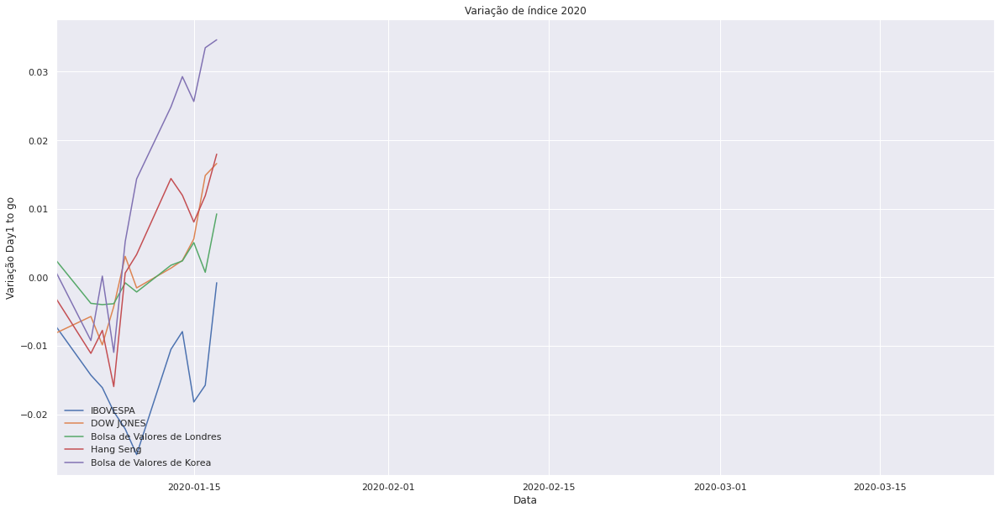

...

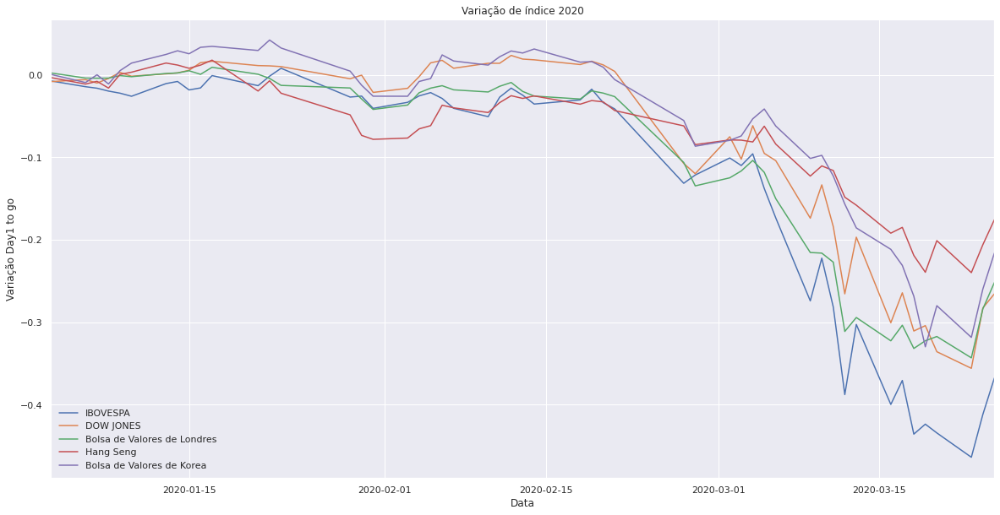

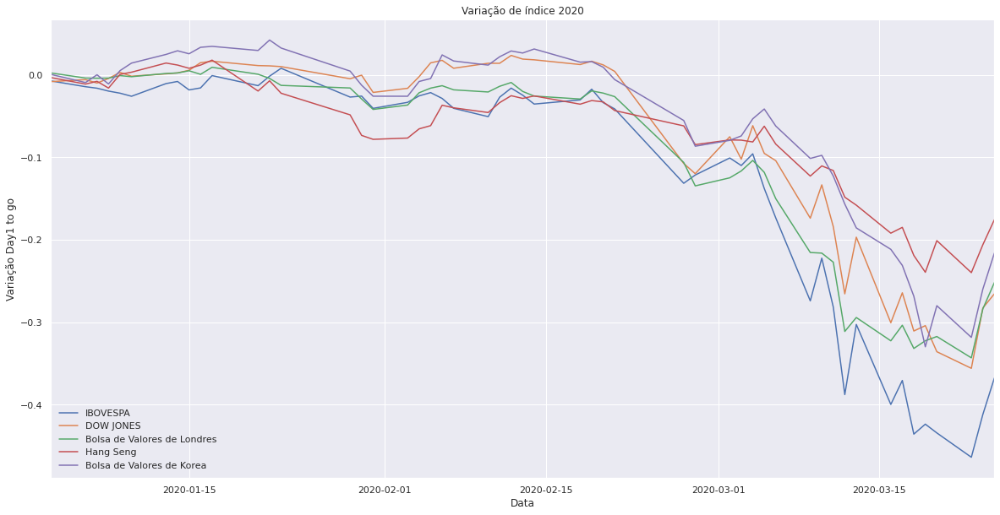

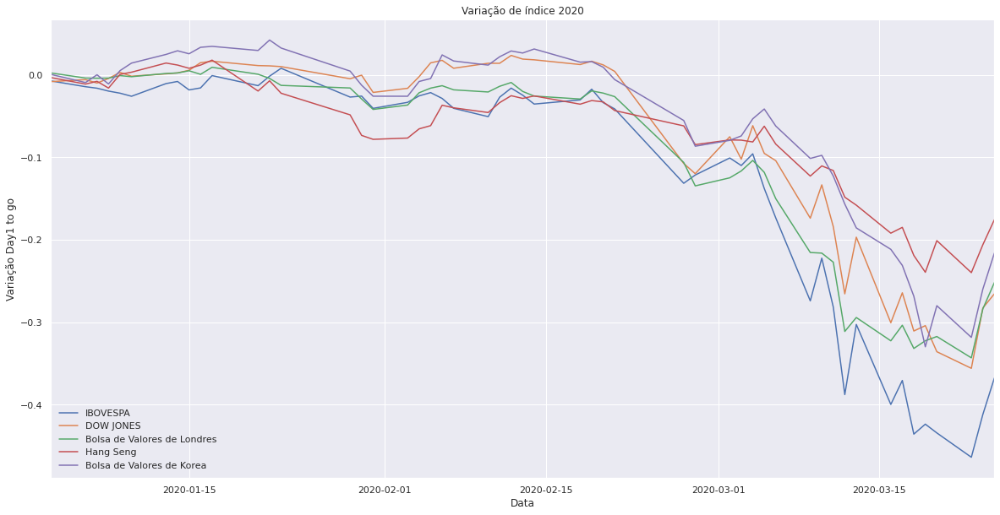

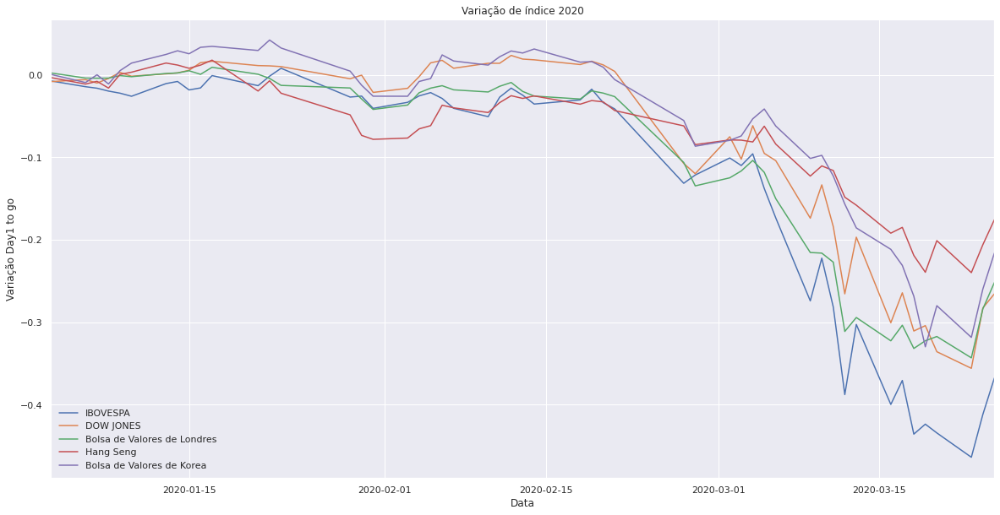

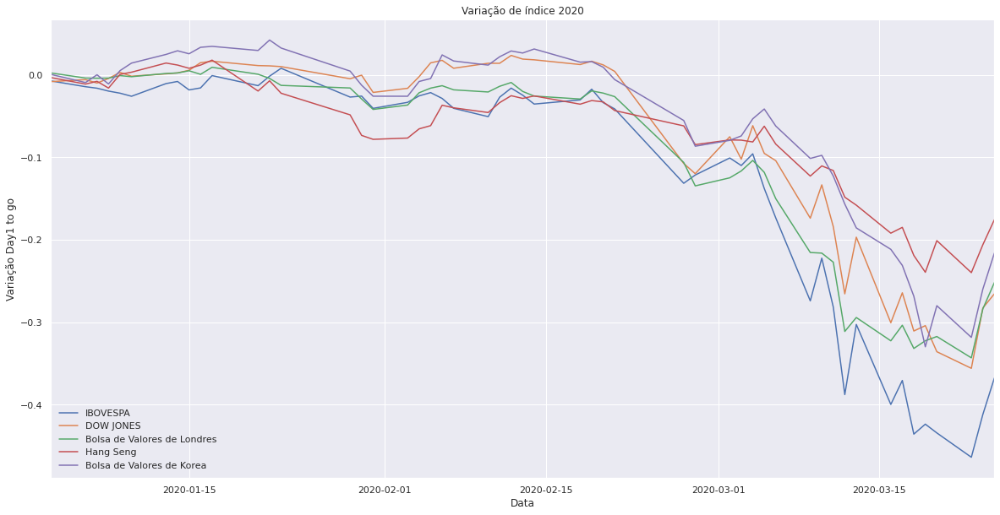

In [244]:
#Salvar a evolução da variação comparado com a abertura do ano 2020
output_path = '/content/drive/My Drive/Coronavirus/Gif_indice_II'
for i in range(3,len(datas),2):
  teste = d014.iloc[:,0:i]
  teste2 = d014.iloc[:,range(i+1,len(d014.columns))]
  teste2 = teste2.transpose()
  teste2 = teste2.applymap(lambda x: np.nan)
  teste = teste.transpose()
  teste3 = teste.append(teste2)
  fig = plt.gcf()
  plt.rcParams["figure.figsize"] = (20,10)
  plt.plot(teste3.index,teste3)
  axes = plt.gca()
  axes.set_xlim([min(teste3.index),max(teste3.index)])
  axes.legend(teste3.columns,loc='lower left', frameon=False)
  plt.title("Variação de índice 2020")
  plt.ylabel("Variação Day1 to go")
  plt.xlabel("Data")
  plt.show()
  filepath = os.path.join(output_path, str(i)+'_indice.jpg')
  fig.savefig(filepath)

In [0]:
#Abrir os gráfico salvos e compactar para montar o GIF
frames = []
imgs = glob.glob("/content/drive/My Drive/Coronavirus/Gif_indice_II/*.jpg")
for i in imgs:
    new_frame = Image.open(i)
    frames.append(new_frame)

frames[0].save('/content/drive/My Drive/Coronavirus/Gif_indice_II/jpg_to_gif.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=500, loop=0)

# Análise de menções no Google

Analisar o termometro da preocupação das pessoas pelo mundo, quando o assunto é Coronavirus

In [85]:
#Carregar as menções da palavra Coronavirus
pytrend = TrendReq()
pytrend.build_payload(kw_list=['Coronavirus'])
#Selecionar a região de interesse
df = pytrend.interest_by_region()
df.sort_values('Coronavirus',ascending=False, inplace=True)
#Carregar os mapas salvos no Drive
shapefile = '/content/drive/My Drive/Coronavirus/Mapa/ne_110m_admin_0_countries.shp'
#Ler os arquivos de mapa
gdf = gpd.read_file(shapefile)[['ADMIN', 'ADM0_A3', 'geometry']]
#Renomear as colunas
gdf.columns = ['country', 'country_code', 'geometry']
#Trocar o nome do USA, já que nas duas bases estão diferentes. Fiz um check utilizando merge e depois filtrando nan
gdf.loc[gdf.country=='United States of America','country'] = 'United States'
#Unir os dados geograficos com as menções do google
merged = gdf.merge(df, left_on = 'country', right_on = df.index, how='left')
#O que for nan será substituido por zero
merged.loc[pd.isnull(merged['Coronavirus']),'Coronavirus'] = 0
#Ler arquivo no formato json
merged_json = json.loads(merged.to_json())
#Converter o formato
json_data = json.dumps(merged_json)
#Input GeoJSON para plotar no mapa
geosource = GeoJSONDataSource(geojson = json_data)
#Definir a paleta de cores a ser utilizado
palette = brewer['YlGnBu'][8]
#Inverter a ordem das cores, quanto maior, mais intenso 
palette = palette[::-1]
#Ajustar as cores de forma linear relacionado com a coluna da variável a ser observada
color_mapper = LinearColorMapper(palette = palette, low = 0, high = 40)
#Definir o intervalo a ser separado a intensidade
tick_labels = {'0': '0%', '5': '5%', '10':'10%', '15':'15%', '20':'20%', '25':'25%', '30':'30%','35':'35%', '40': '>40%'}
#Criar a barra de cor
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,width = 500, height = 20,
border_line_color=None,location = (0,0), orientation = 'horizontal', major_label_overrides = tick_labels)
#Criar o mapa
p = figure(title = 'Procura por coronavirus no google', plot_height = 600 , plot_width = 950, toolbar_location = None)
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None
#Adicionar o arquivo gerado para análise 
p.patches('xs','ys', source = geosource,fill_color = {'field' :'Coronavirus', 'transform' : color_mapper},
          line_color = 'black', line_width = 0.25, fill_alpha = 1)
#Especificar o layout
p.add_layout(color_bar, 'below')
#Visualizar
output_notebook()
show(p)

In [87]:
#As sugestões de palavras chaves, relacionadas com Coronavirus em portugues no Brasil
pytrends = TrendReq(hl='pt-BR', tz=360, geo = 'BR')
keywords = pytrends.suggestions(keyword='Coronavirus')
df = pd.DataFrame(keywords)
df = df.drop(columns= 'mid')
df

,title,type
0,Coronavírus,Vírus
1,Coronaviridae,Vírus
2,Síndrome respiratória aguda grave,Doença
3,Coronavírus relacionado à síndrome respiratóri...,Vírus
4,MERS-CoV,Vírus


In [0]:
today = date.today()
#Procurar as palavras relacionadas com o Coronavirus no ano de 2020 - Brasil
pytrends = TrendReq(hl='pt-BR', tz=360)
pytrends.build_payload(['Coronavirus'], cat=0, timeframe=('2020-01-01 '+ str(today)),  gprop='', geo='BR')
df = pytrends.interest_over_time()
df.drop('isPartial',axis=1,inplace=True)

In [0]:
#Observar as palavras mais relacionadas com Coronavirus: As mais relacionadas e as que veem ganhando importância na procura
pytrends = TrendReq(hl='pt-BR', tz=360)
pytrends.build_payload(['Coronavirus'], cat=0, timeframe=('2020-01-01 '+ str(today)),  gprop='', geo='BR')
related_queries = pytrends.related_queries()
covid1 = related_queries['Coronavirus']['rising']
covid1 = pd.DataFrame(covid1)

In [0]:
covid2 = related_queries['Coronavirus']['top']
covid2 = pd.DataFrame(covid2)

In [91]:
#Plavras chaves que veem ganhando importância na procura
covid1.head()

,query,value
0,brasil coronavirus,1994900
1,coronavirus sintomas,1207750
2,coronavirus no brasil,663750
3,corona,663400
4,coronavirus casos,599100


In [0]:
#Palavras mais relacionadas com a palavra chave selecionada
covid2.head()

,query,value
0,coronavirus brasil,100
1,sintomas coronavirus,76
2,corona,38
3,coronavirus no brasil,33
4,casos coronavirus,30


In [0]:
#Criar os valores para os dias restantes ate a data vigente
cor = df.tail(2).mean(axis = 0) 
#Criar o dataframe faltante para inserir no google trend
x = str(df.tail(1).index[0])
x = x.split(" ")[0]
y = pd.date_range(end = date.today(),start=x)
y = pd.DataFrame(y)
y.drop(0, axis=0, inplace=True)
y['Coronavirus'] = cor[0]
y.set_index(0, inplace=True)
df = df.append(y)

Text(0.5, 0, 'Data')

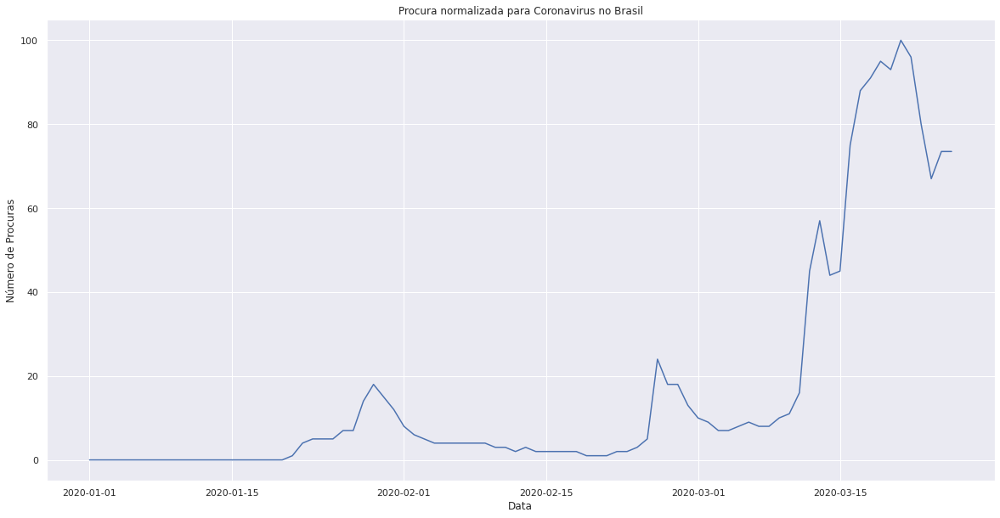

In [93]:
#Gráfico no tempo mostrando o crescimento na procura do termo Coronavirus no Brasil
sns.set()
df['timestamp'] = pd.to_datetime(df.index)
sns.lineplot(df['timestamp'], df['Coronavirus'])
plt.title("Procura normalizada para Coronavirus no Brasil")
plt.ylabel("Número de Procuras")
plt.xlabel("Data")

In [0]:
#Criar função para executar a busca no google com entrada de parâmetro
def get_searches(key_word, state, ct):
    pytrends = TrendReq(hl='en-US', tz=360)
    pytrends.build_payload([key_word], cat=0, timeframe='2020-01-01 '+ str(today),  gprop='',geo='{}'.format(state))    
    df = pytrends.interest_over_time()
    
    sns.set()
    df['timestamp'] = pd.to_datetime(df.index)
    sns.lineplot(df['timestamp'], df[key_word])
    
    plt.title("Procura normalizada para Coronavirus em alguns lugares no mundo")
    plt.ylabel("Numéros de procuras")
    axes = plt.gca()
    axes.legend(ct,loc='upper left', frameon=False)
    plt.xlabel("Data")

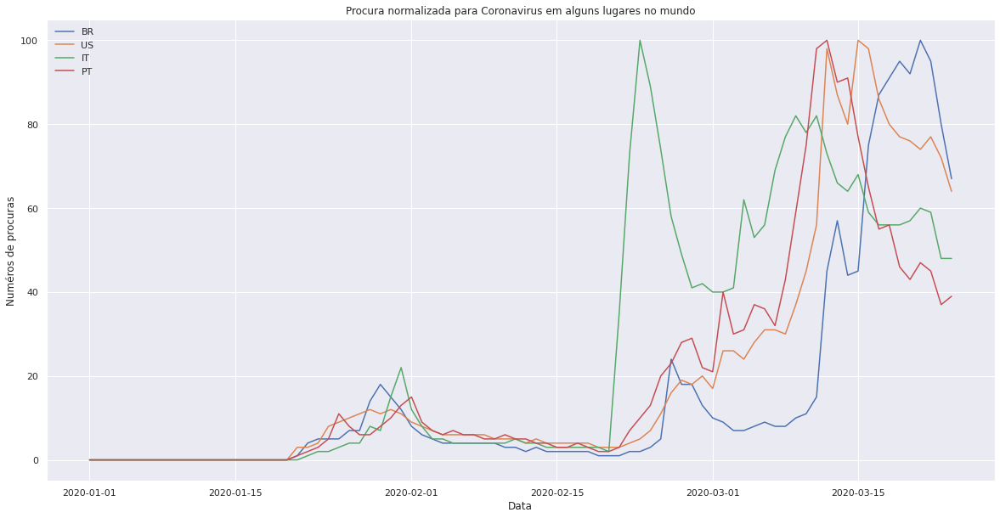

In [101]:
pais = ['BR','US','IT','PT']
#Gráfico de evolução em 2020 de alguns países selecionados
get_searches('Coronavirus', 'BR', pais)
get_searches('Coronavirus', 'US', pais)
get_searches('Coronavirus', 'IT', pais)
get_searches('Coronavirus', 'PT', pais)

# Casos de coronavírus pelo mundo

As informações foram disponibilizadas pela faculdade Johns Hopkis e são atualizadas diariamente.
Basicamente as bases se dividem em três:

*   Confirmados - df_confd
*   Mortes - df_death
*   Recuperados - df_recvd






In [0]:
#Carregar as bases 
df_confd = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
df_death = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
df_recvd = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv')

## Evolução dos casos na China

In [0]:
#Selecionar apenas os casos na China
df_confd_china = df_confd.loc[df_confd.loc[:,'Country/Region'] == 'China',:]
df_death_china = df_death.loc[df_death.loc[:,'Country/Region'] == 'China',:]
df_recvd_china = df_recvd.loc[df_recvd.loc[:,'Country/Region'] == 'China',:]

### Evolução no tempo do Coronavirus nas províncias chinesas

In [116]:
#Carregar o mapa por provincia da China, alterando os nomes de algumas que estavam escritas diferentes
shapefile = '/content/drive/My Drive/Coronavirus/China_mapa/chn_admbnda_adm1_ocha.shp'
df_confd_china.loc[df_confd_china.loc[:,'Province/State']=='Guangxi','Province/State'] = 'Guangxi Zhuang'
df_confd_china.loc[df_confd_china.loc[:,'Province/State']=='Macau','Province/State'] = 'Macao'
df_confd_china.loc[df_confd_china.loc[:,'Province/State']=='Ningxia','Province/State'] = 'Ningxia Hui'
df_confd_china.loc[df_confd_china.loc[:,'Province/State']=='Xinjiang','Province/State'] = 'Xinjiang Hui'

gdf = gpd.read_file(shapefile)[['ADM1_EN', 'geometry']]
gdf.columns = ['Province/State', 'geometry']

s = pd.Series(gdf['Province/State'])
s.replace(" Province", "", regex=True, inplace=True)
s.replace(" province", "", regex=True, inplace=True)
s.replace(" Municipality", "", regex=True, inplace=True) 
s.replace(" Autonomous Region", "", regex=True, inplace=True)
s.replace(" Special Administrative Region", "", regex=True, inplace=True) 
gdf['Province/State'] = s

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [117]:
china = df_confd_china.iloc[:,[0,df_confd_china.shape[1]-1]]
china.iloc[:,1].describe()

count       33.000000
mean      2474.575758
std      11734.109833
min          1.000000
25%        134.000000
50%        319.000000
75%        638.000000
max      67801.000000
Name: 3/25/20, dtype: float64

In [0]:
#Salvar os nomes dos arquivos no filepatch2 para chamar em ordem no GIF
filepath2 = []

#Sem comentários porque já foi comentado anteriormente quando foi utilizado na primeira vez
output_path = '/content/drive/My Drive/Coronavirus/Gif_china'

for i in range(4,(df_confd_china.shape[1]-5),2):

  china = df_confd_china.iloc[:,[0,i]]
  #china.iloc[0,1] = 0
  #china.iloc[:,1] = (china.iloc[:,1]/sum(china.iloc[:,1]))*100
  #china.iloc[0,1] = 15
  
  merged = gdf.merge(china, left_on = 'Province/State', right_on = 'Province/State', how='left')
  merged.loc[pd.isnull(merged.iloc[:,2]),merged.columns[2]] = 0
  data = str(merged.columns[2])

  merged_json = json.loads(merged.to_json())
  json_data = json.dumps(merged_json)

  geosource = GeoJSONDataSource(geojson = json_data)
  palette = brewer['Reds'][4]
  palette = palette[::-1]
  color_mapper = LinearColorMapper(palette = palette, low = 0, high = 2000,)
  tick_labels = {'0': '0', '500':'500', '1000':'1000', '1500':'1500', '2000':'>2000'}
  color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,width = 500, height = 20,
  border_line_color=None,location = (0,0), orientation = 'horizontal', major_label_overrides = tick_labels)
  p = figure(title = 'Número de confirmados do coronavirus na China 2020 - ' + str(df_confd_china.columns[i]) +'20', plot_height = 600 , plot_width = 950, toolbar_location = None)
  p.xgrid.grid_line_color = None
  p.ygrid.grid_line_color = None
  
  p.patches('xs','ys', source = geosource,fill_color = {'field' :data, 'transform' : color_mapper},
            line_color = 'black', line_width = 0.25, fill_alpha = 1)
  p.add_layout(color_bar, 'below')

  output_notebook()
  #show(p)
  filepath = os.path.join(output_path, str(i)+'_indice.html')
  filepath2.append(os.path.join(output_path, str(i)+'_indice.jpg'))
  output_file(filepath)
  save(p)

In [0]:
frames = []
for i in filepath2:
    new_frame = Image.open(i)
    frames.append(new_frame)
frames[0].save('/content/drive/My Drive/Coronavirus/Gif_china/jpg_to_gif.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=800, loop=0)

### Evolução dos casos na China toda, versus a província onde aconteceu o primeiro relato, Hubei

[]

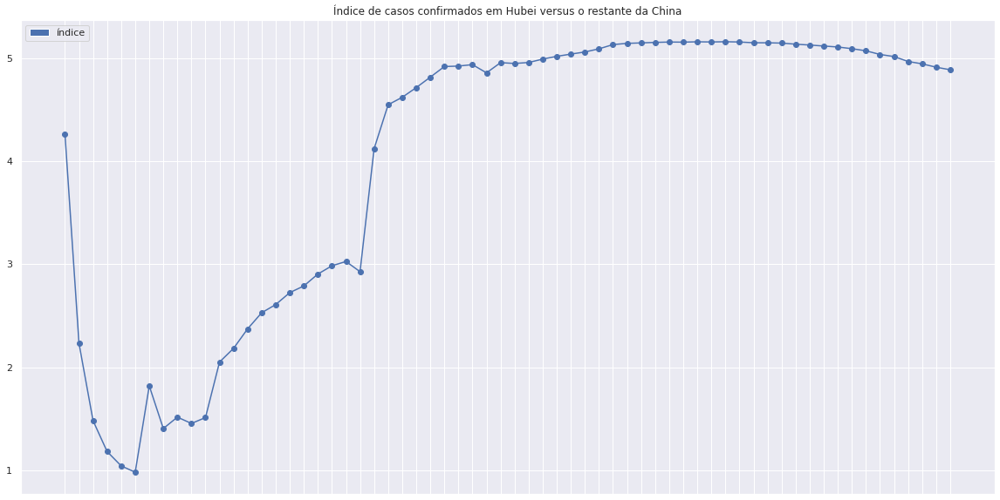

In [121]:
#Visualizar a propagação de casos na província Hubei versus o restante da China
china = df_confd_china.drop(['Country/Region','Lat', 'Long'], axis = 1)
hubei = china.loc[china['Province/State']=='Hubei',:]
china = china.loc[china['Province/State']!='Hubei',:].aggregate('sum')
china = pd.DataFrame(china)
china = china.transpose()
china.iloc[0,0] = 'NotHubei'
china = hubei.append(china, ignore_index=True)
china = china.set_index(china['Province/State'])
china = china.drop(['Province/State'],axis=1)
confirm_index = china.loc['Hubei',:]/china.loc['NotHubei',:]
confirm_index = pd.DataFrame({'confirm_index':confirm_index})
plt.rcParams["figure.figsize"] = (20,10)
plt.plot(confirm_index.index,confirm_index.confirm_index, 'bo-')
#plt.axis('off')
plt.title('Índice de casos confirmados em Hubei versus o restante da China')
red_patch = mpatches.Patch(label='índice')
plt.legend(handles=[red_patch],loc="upper left")
frame = plt.gca()
frame.axes.xaxis.set_ticklabels([])

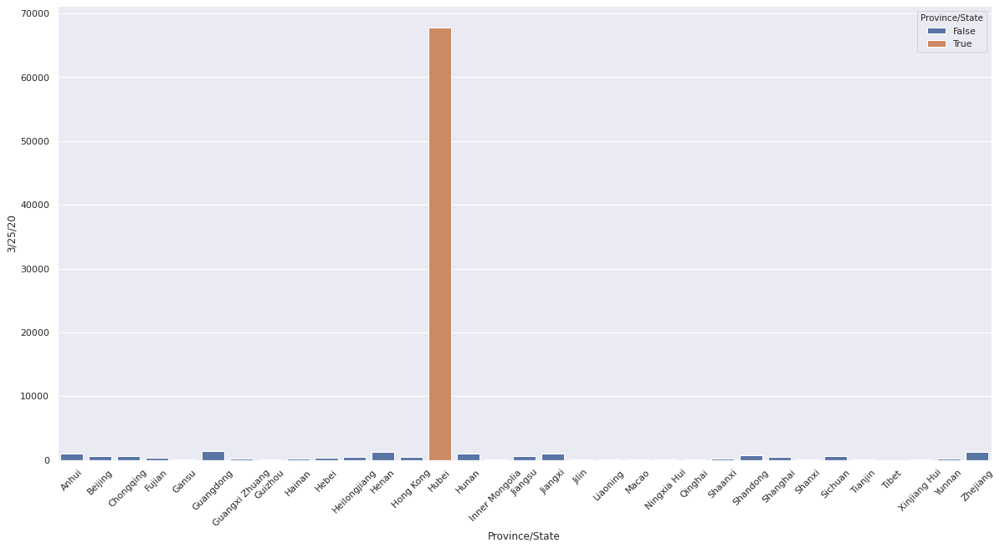

In [122]:
china = df_confd_china.iloc[:,[0,df_confd_china.shape[1]-1]]
graf = sns.barplot(x=china.iloc[:,0], y = china.iloc[:,1], hue = china.iloc[:,0]=='Hubei',dodge=False)
graf = graf.set_xticklabels(graf.get_xticklabels(), rotation=45)

Verificar outros dados sociais sobre a região mais afetada da China, comparado as demais províncias

In [0]:
China_healthcare_income = pd.read_csv("/content/drive/My Drive/Coronavirus/China_data/China_healthcare_income.csv", sep = ';', decimal=',')

In [127]:
China_healthcare_income.head(5)

,Region,2018_Number_HCare_Institution,2018_Number_Hospitals,2018_Center_Disease_Prevention,2018_PerCapita_Disposable_Income,2018_Perc_PerCapita_Disposable_Income
0,Beijing,10058,648,24,62361.22,0.090
1,Tianjin,5686,420,15,39506.15,0.067
2,Hebei,85088,2108,12,23445.65,0.091
3,Shanxi,42079,1368,8,21990.14,0.077
4,Inner Mongolia,24610,818,50,28375.65,0.083


In [0]:
x = np.array(China_healthcare_income.iloc[:,range(1,6)])

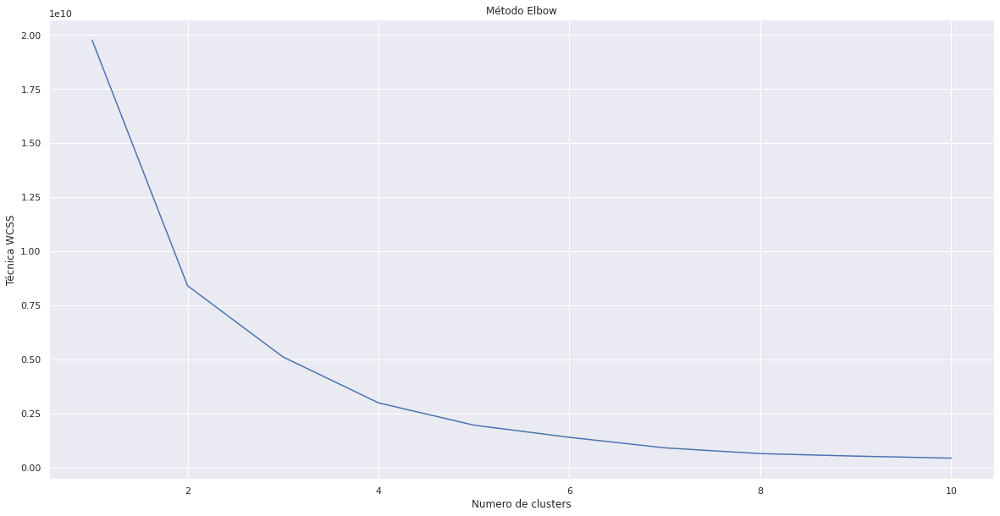

In [129]:
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(x)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss)
plt.title('Método Elbow')
plt.xlabel('Numero de clusters')
plt.ylabel('Técnica WCSS')
plt.show()

In [130]:
kmeans = KMeans(n_clusters=2, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(x)
China_healthcare_income['cluster'] = pred_y
China_healthcare_income.groupby('cluster').mean()

,2018_Number_HCare_Institution,2018_Number_Hospitals,2018_Center_Disease_Prevention,2018_PerCapita_Disposable_Income,2018_Perc_PerCapita_Disposable_Income
cluster,,,,,
0,22811.880000,841.880000,30.320000,28600.950000,0.086800
1,71189.333333,1993.666667,67.166667,26354.166667,0.088833


In [0]:
China_healthcare_income = China_healthcare_income.loc[:,['Region','cluster']]
China_population = pd.read_csv("/content/drive/My Drive/Coronavirus/China_data/China_population.csv", sep = ';', decimal=',')
China_population = pd.merge(China_population, China_healthcare_income, left_on = '\ufeffDivision', right_on ='Region', how = 'left')
China_population = China_population.drop('Region', axis = 1)
China_population['cluster'] = China_population['cluster'].map(lambda x: 2 if pd.isna(x) else x)

In [132]:
China_population.head(5)

,﻿Division,Population,cluster
0,Guangdong,104303132,1.0
1,Shandong,100063065,1.0
2,Henan,94023567,1.0
3,Sichuan,80418200,1.0
4,Jiangsu,78659903,0.0


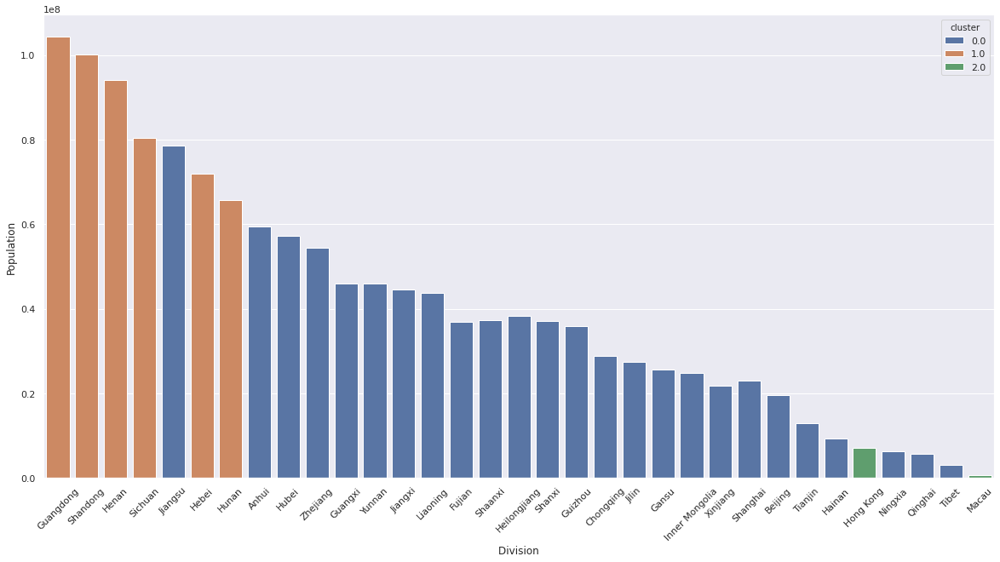

In [133]:
graf = sns.barplot(x=China_population['\ufeffDivision'], y = China_population['Population'], hue = China_population['cluster'],dodge=False)
graf = graf.set_xticklabels(graf.get_xticklabels(), rotation=45)

# Modelo SIR para China

Uma pessoa contaminada pode transmitir para 3-6 pessoas e fica hábil em transmitir o coronavirus por 5-7 dias. Cerca de 80% das pessoas com coronavirus são assintomáticas, logo não entra na conta dos confirmados.

In [0]:
def modelo_sir(I0,N,beta,gamma):
# Initial number of infected and recovered individuals, I0 and R0.
    R0 = round(beta/gamma,3)
    
    # Everyone else, S0, is susceptible to infection initially.
    S0 = N - I0 - R0

    # A grid of time points (in days)
    t = np.linspace(0, 160, 160)

    # The SIR model differential equations.
    def deriv(y, t, N, beta, gamma):
        S, I, R = y
        dSdt = -beta * S * I / N
        dIdt = beta * S * I / N - gamma * I
        dRdt = gamma * I
        return dSdt, dIdt, dRdt

    # Initial conditions vector
    y0 = S0, I0, R0

    # Integrate the SIR equations over the time grid, t.
    ret = odeint(deriv, y0, t, args=(N, beta, gamma))
    S, I, R = ret.T
   
    # Plot the data on three separate curves for S(t), I(t) and R(t)
    fig = plt.figure(facecolor='w')
    ax = fig.add_subplot(111,  axisbelow=True)
    ax.plot(t, S/N, 'blue', alpha=0.5, lw=1.5, label='Suscetíveis')
    ax.plot(t, I/N, 'red', alpha=0.5, lw=1.5, label='Infectados')
    ax.plot(t, R/N, 'green', alpha=0.5, lw=1.5, label='Recuperados')
    ax.set_xlabel('Tempo (dias)')
    ax.set_ylabel('Percentual da população (%)')
    ax.set_ylim(0,1)
    ax.set_xlim(0,200)
    ax.yaxis.set_tick_params(length=0)
    ax.xaxis.set_tick_params(length=0)
    #ax.grid(b=True, which='major', c='w', lw=2, ls='-')
    ax.grid()
    title= '$ \\beta = $'+str(beta)+'$, \\gamma = $'+str(gamma)+'$, R_0 = $'+str(R0)
    ax.set_title(title)
    legend = ax.legend()
    legend.get_frame().set_alpha(0.5)

    fig2 = plt.figure(facecolor='w')
    ax2 = fig2.add_subplot(111,  axisbelow=True)
    ax2.plot(t, I/N, 'red', alpha=0.5, lw=1.5, label='Mortos')
    ax2.set_xlabel('Tempo (dias)')
    ax2.set_ylabel('Quantidade x 1.000')
    ax2.set_ylim(0,1)
    ax2.set_xlim(0,200)
    ax2.yaxis.set_tick_params(length=0)
    ax2.xaxis.set_tick_params(length=0)
    ax2.grid()
    title= '$ \\beta = $'+str(beta)+'$, \\gamma = $'+str(gamma)+'$, R_0 = $'+str(R0)
    ax2.set_title(title)
    legend = ax2.legend()
    legend.get_frame().set_alpha(0.5)
    
    for spine in ('top', 'right', 'bottom', 'left'):
        ax.spines[spine].set_visible(False)
    plt.show()
    solved = pd.DataFrame(ret)
    solved.to_csv("solved.csv",encoding='ISO-8859-1',sep=';')
    #Infectado = pd.DataFrame(I)
    return

In [0]:
china = df_confd_china.iloc[:,[0,df_confd_china.shape[1]-1]]
china = china.merge(China_population, right_on='\ufeffDivision', left_on='Province/State', how='left')
china = china.drop('\ufeffDivision', axis=1)
china['Population_coronavirus'] = (china.iloc[:,1]/sum(china.iloc[:,1]))*china.iloc[:,2]

In [0]:
#Premissa que cada pessoa contamina 4 pessoas em um período de 6 dias de contaminação, que é o quantidade de dia que o virus fica encubado 
#já que essa contaminação é aleatória durante esse período
n = 5
pop = round(china['Population_coronavirus'].sum())
s = pop*0.9

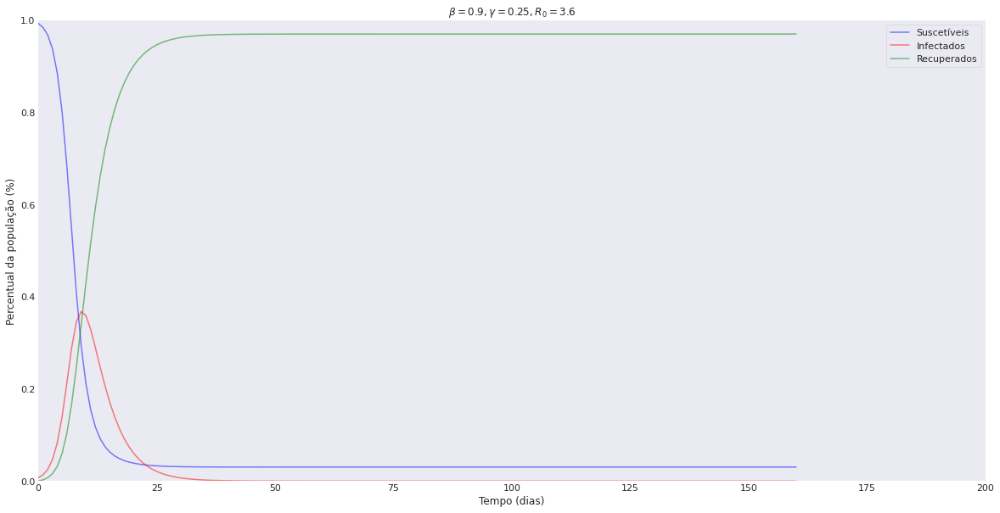

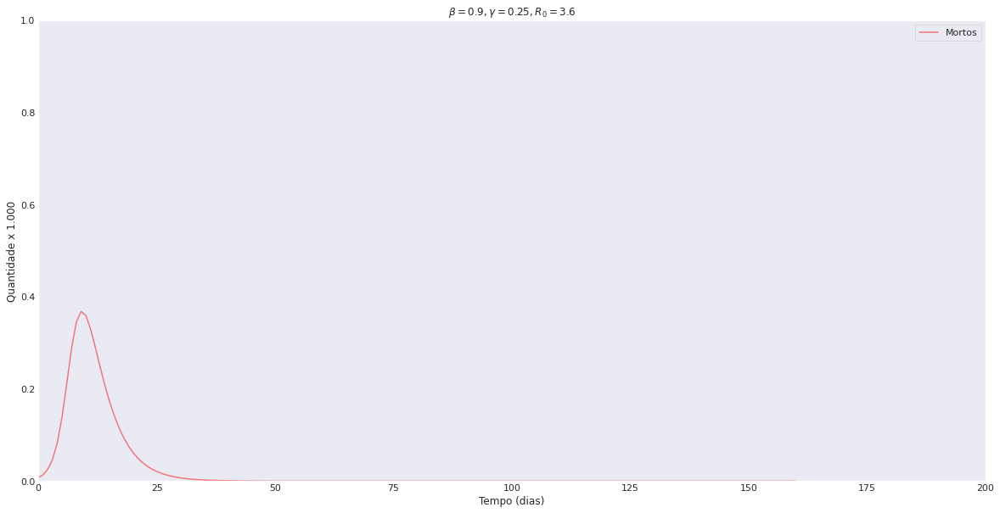

In [137]:
beta = round(s/pop,4)
gamma = round(1/4,3)
N = pop
I0 = (china.iloc[:,1].sum())/0.2

modelo_sir(I0,N,beta,gamma)

In [0]:
print("Beta {}, \n Gamma {} \n N {} \n I0 {}".format(beta, gamma, N, I0))

# Análise dos casos pelo mundo

Devido a declaração do prefeito da cidade zero do coronavirus, que postergou a divulgação da epidemia, China na província Hubei não será contabilizado como D0 o dia que foi reportado para WHO.

In [0]:
casos_mundo = df_confd.loc[:,['Country/Region',df_confd.iloc[:,df_confd.shape[1]-1].name]]
casos_mundo = df_confd.loc[:,['Country/Region',df_confd.iloc[:,df_confd.shape[1]-1].name]]
casos_mundo = casos_mundo.groupby('Country/Region')
casos_mundo = casos_mundo.first()
casos_mundo = casos_mundo.sort_values(df_confd.iloc[:,df_confd.shape[1]-1].name,ascending=False)
#casos_mundo = casos_mundo.head(20)
casos_mundo = casos_mundo.head(20)
h = round(casos_mundo.iloc[:,0]/1000,0)
h = h.map(lambda x: '~'+str(int(x)) + 'k')
casos_mundo['Legenda'] = h
casos_mundo.columns = ['Coronavirus','Legenda']

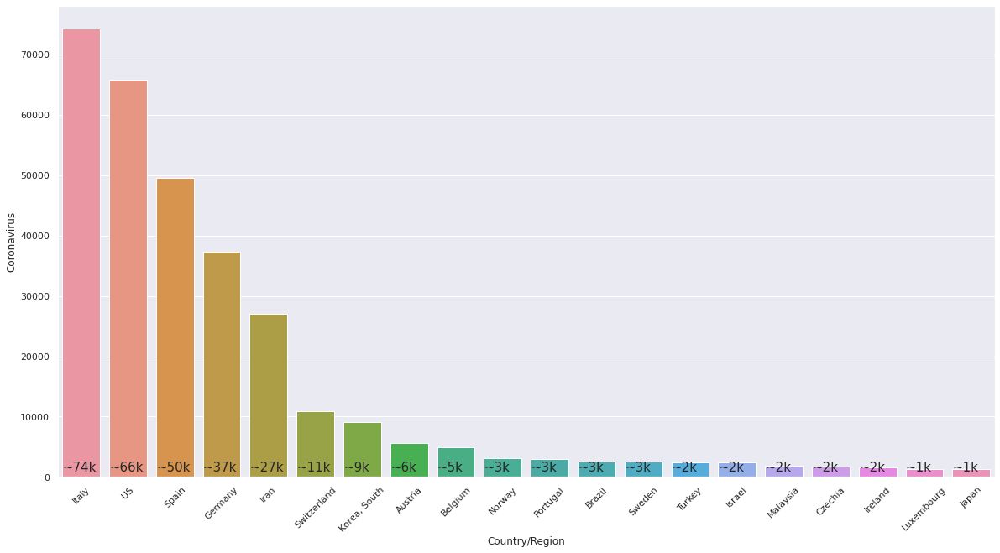

In [139]:
graf = sns.barplot(x=casos_mundo.index, y = casos_mundo.iloc[:,0],dodge=False)
for i in range(len(casos_mundo)):
  #graf.text(x = casos_mundo.index[i]-0.5 , y = casos_mundo.iloc[i,0]+0.1, s = casos_mundo.iloc[i,1], size = 6)
  graf.text(x = i-0.4 , y = 1000, s = casos_mundo.iloc[i,1], size = 15)
plt.subplots_adjust(bottom= 0.2, top = 0.98)
graf = graf.set_xticklabels(graf.get_xticklabels(), rotation=45)
plt.show()

## Implicancia de fatores sociais e demograficos

In [0]:
World_age = pd.read_csv("/content/drive/My Drive/Coronavirus/World_byage/Country_byage.csv", sep = ';', decimal=',')
#World_age = World_age.drop(range(9,World_age.shape[0]),axis = 0)
World_age = World_age.set_index("Age by Range")
casos_mundo = casos_mundo.merge(World_age, left_on=casos_mundo.index, right_on=World_age.index, how = 'left')

In [0]:
casos_mundo['Population2020'] = (casos_mundo.iloc[:,range(3,12)].apply(sum,axis=1))*1000

In [0]:
casos_mundo.iloc[:,range(3,12)] = casos_mundo.iloc[:,range(3,12)].div(casos_mundo.iloc[:,range(3,12)].sum(axis=1), axis=0)

In [0]:
casos_mundo['+50 yrs'] = casos_mundo.iloc[:,range(9,12)].apply(sum,axis=1)

In [0]:
World_tech = pd.read_csv("/content/drive/My Drive/Coronavirus/World_byage/Country_tech.csv", sep = ';', decimal=',')
World_tech = World_tech.drop('Unnamed: 3', axis = 1)
World_tech.columns = ['Country','Rank_tech','Score_tech']
World_tech = World_tech.set_index(World_tech['Country'])
World_tech = World_tech.drop('Country', axis = 1)

In [0]:
casos_mundo = casos_mundo.set_index('key_0',drop=True)

In [0]:
casos_mundo = casos_mundo.merge(World_tech, left_on=casos_mundo.index, right_on=World_tech.index, how = 'left')

In [0]:
casos_mundo_morte = df_death.loc[:,['Country/Region',df_death.iloc[:,df_death.shape[1]-1].name]]
casos_mundo_morte = df_death.loc[:,['Country/Region',df_death.iloc[:,df_death.shape[1]-1].name]]
casos_mundo_morte = casos_mundo_morte.groupby('Country/Region')
casos_mundo_morte = casos_mundo_morte.first()
casos_mundo_morte = casos_mundo_morte.sort_values(df_death.iloc[:,df_death.shape[1]-1].name)
h = round(casos_mundo_morte.iloc[:,0]/1000,0)
h = h.map(lambda x: '~'+str(int(x)) + 'k')
casos_mundo_morte['Legenda'] = h
casos_mundo_morte.columns = ['Coronavirus_mortes','Legenda_morte']

In [0]:
casos_mundo = casos_mundo.set_index('key_0',drop=True)
casos_mundo = casos_mundo.merge(casos_mundo_morte, left_on=casos_mundo.index, right_on=casos_mundo_morte.index, how = 'left')

In [0]:
casos_mundo['Pop_corona'] = casos_mundo['Coronavirus']/casos_mundo['Population2020']
casos_mundo['Casos_morte'] = casos_mundo['Coronavirus']/casos_mundo['Coronavirus_mortes']

In [0]:
casos_mundo['+50 yrs abs'] = casos_mundo['+50 yrs'] * casos_mundo['Population2020']

In [0]:
World_temp = pd.read_csv("/content/drive/My Drive/Coronavirus/World_byage/Country_clima.csv", sep = ';', decimal=',')
World_temp = World_temp.set_index('Country',drop=True)
casos_mundo = casos_mundo.set_index('key_0', drop = True)

In [0]:
casos_mundo = casos_mundo.merge(World_temp, left_on=casos_mundo.index, right_on=World_temp.index, how = 'left')

In [0]:
#https://luminocity3d.org/WorldPopDen/#3/22.27/-4.92
Country = ['Italy','China','Iran','France','Spain','Switzerland','Korea, South', 'Germany', 'Netherlands','Belgium']
Area_construida = [31.1,472.1,18.6,25.6,16.8,4.6,11.6,42.3,9.5,8.4]
densidade_area_constr = [1.44,2.57,3.65,1.59,2.13,1.42,3.98,1.39,1.49,1.08]
densidade = pd.DataFrame({'Country/Province': Country, 'Area_constr': Area_construida, 'Densidade_area': densidade_area_constr})
densidade = densidade.set_index('Country/Province', drop = True)

In [0]:
casos_mundo = casos_mundo.set_index('key_0', drop = True)
casos_mundo = casos_mundo.merge(densidade, left_on=casos_mundo.index, right_on=densidade.index, how = 'left')

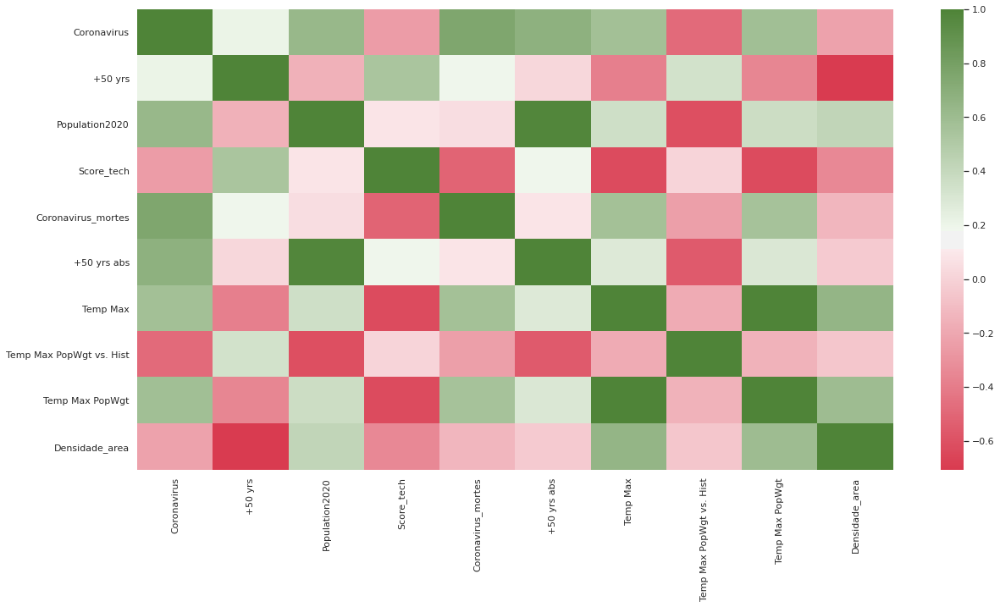

In [155]:
corr = casos_mundo.loc[range(0,10),['Coronavirus','+50 yrs','Population2020','Score_tech','Coronavirus_mortes','+50 yrs abs','Temp Max','Temp Max PopWgt vs. Hist','Temp Max PopWgt','Densidade_area']].corr(method ='pearson') 
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values,cmap=sns.diverging_palette(8, 120, as_cmap=True))

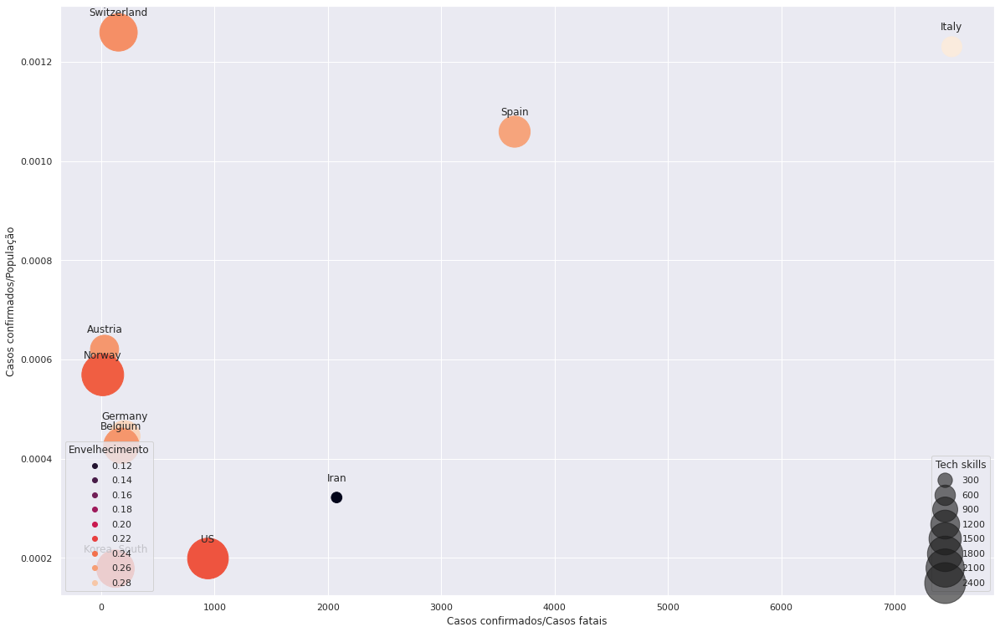

In [160]:
fig, ax = plt.subplots()

casos_mundo = casos_mundo.head(10)

scatter = ax.scatter(x = casos_mundo['Coronavirus_mortes'],y = casos_mundo['Pop_corona'], s = casos_mundo['Score_tech']**6, c = casos_mundo['+50 yrs'])

# produce a legend with the unique colors from the scatter
legend1 = ax.legend(*scatter.legend_elements(),
                    loc="lower left", title="Envelhecimento")
ax.add_artist(legend1)

# produce a legend with a cross section of sizes from the scatter
handles, labels = scatter.legend_elements(prop="sizes", alpha=0.6)
legend2 = ax.legend(handles, labels, loc="lower right", title="Tech skills")

xs = casos_mundo['Coronavirus_mortes']
ys = casos_mundo['Pop_corona']
types = casos_mundo['key_0']

plt.subplots_adjust(bottom= 0.3, top = 1.28)

plt.xlabel('Casos confirmados/Casos fatais')
plt.ylabel('Casos confirmados/População')

for x,y,z in zip(xs,ys,types):

    label = "{}".format(z)

    plt.annotate(label, # this is the text
                 (x,y), # this is the point to label
                 textcoords="offset points", # how to position the text
                 xytext=(0,20), # distance from text to points (x,y)
                 ha='center') # horizontal alignment can be left, right or center

## Evolução no tempo do coronavirus entre os países

In [0]:
d1 = df_confd.columns[4:df_confd.shape[1]]
d2 = df_confd.columns[1]
mergedlist = []
mergedlist.append(d2)
mergedlist.extend(d1)
evo_mundo = df_confd.loc[:,mergedlist]
evo_mundo = evo_mundo.groupby('Country/Region')
evo_mundo = evo_mundo.first()
evo_mundo = evo_mundo.sort_values(df_confd.iloc[:,df_confd.shape[1]-1].name,ascending=False)
evo_mundo = evo_mundo.head(10)

In [0]:
#Salvar o caminho do diretório para salvar
output_path = '/content/drive/My Drive/Coronavirus/Evolucao_country'

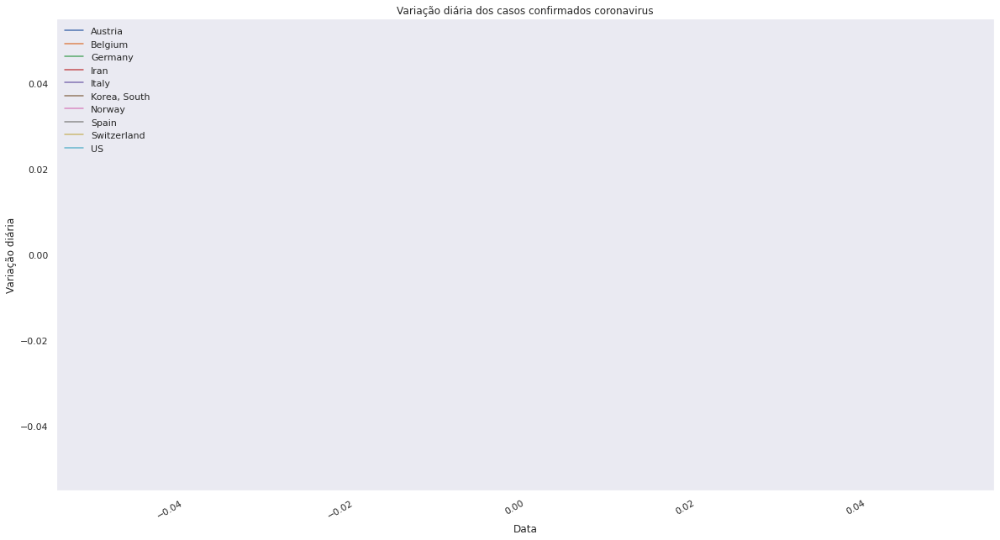

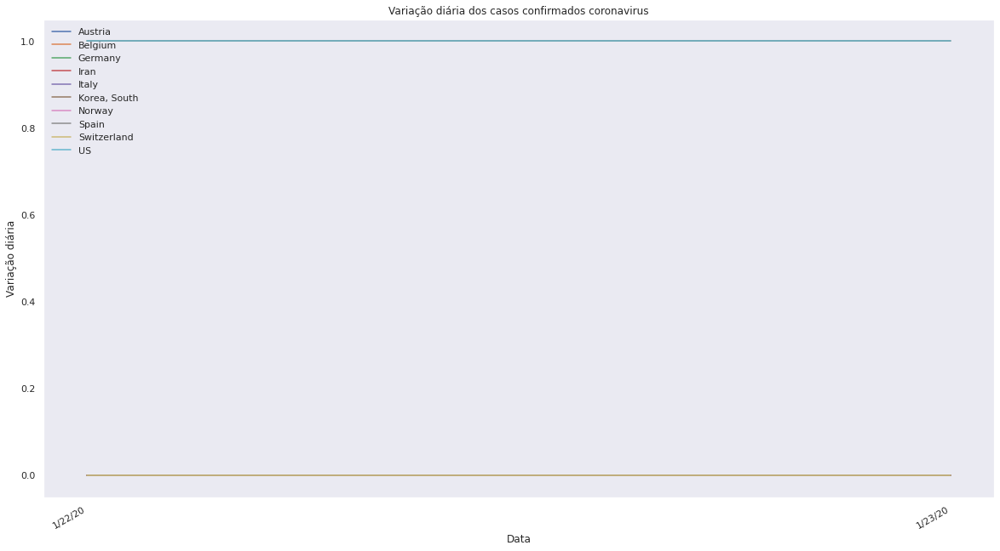

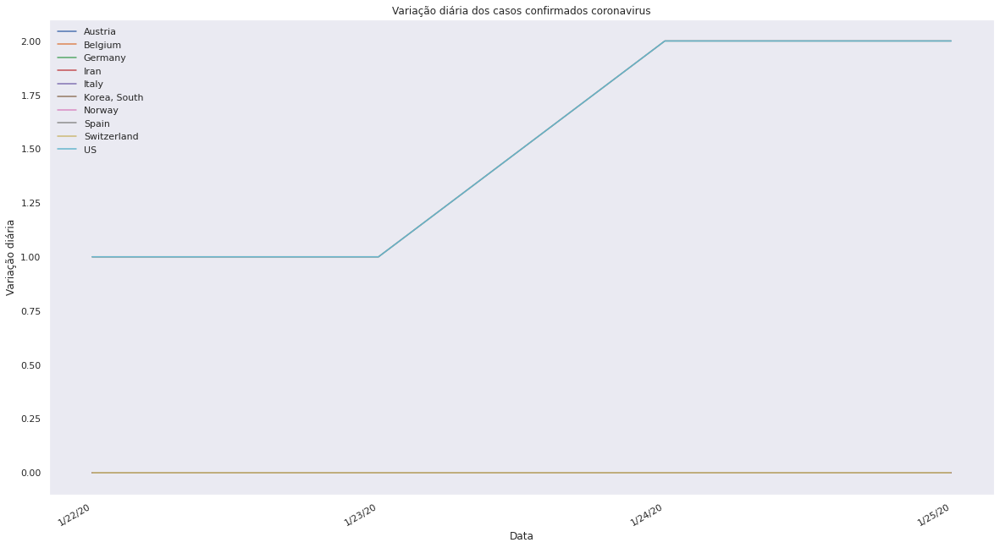

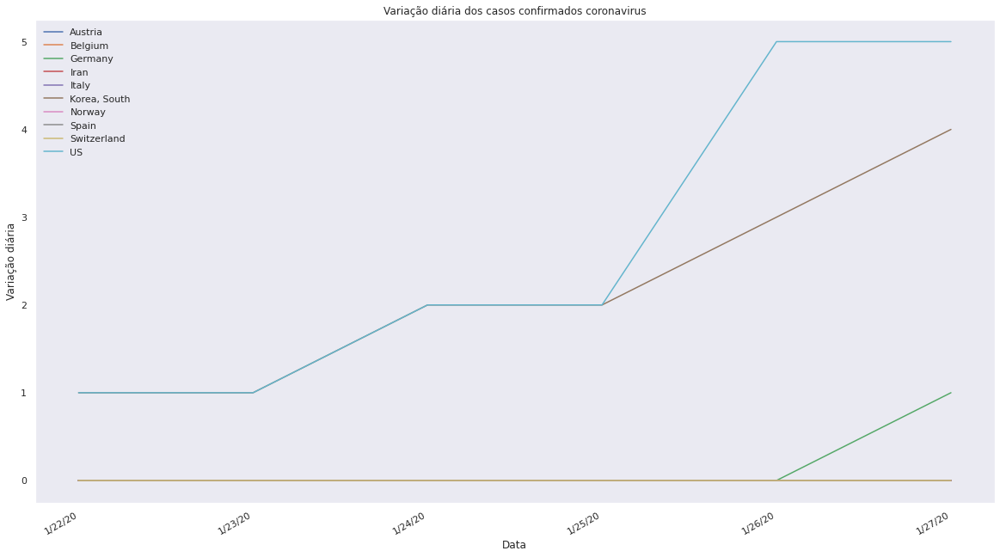

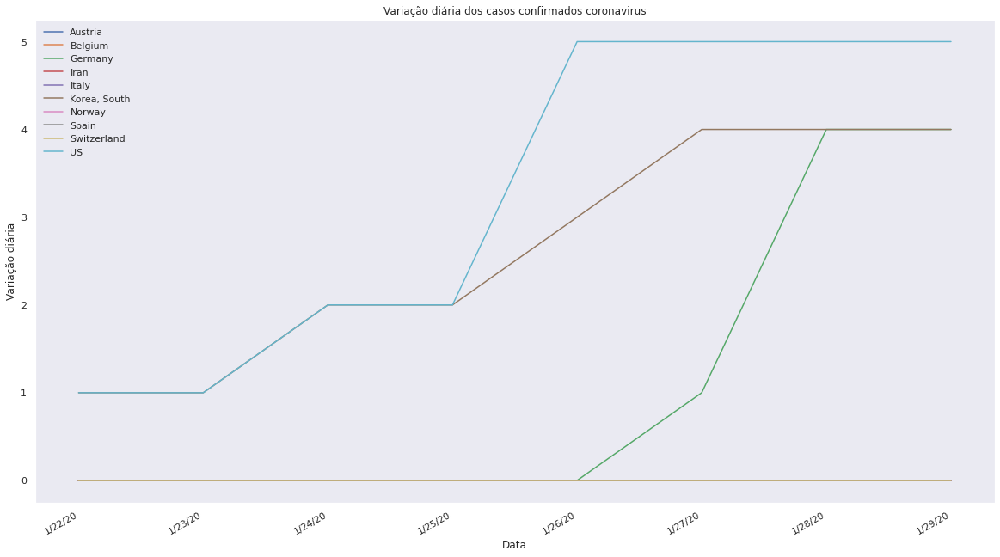

...

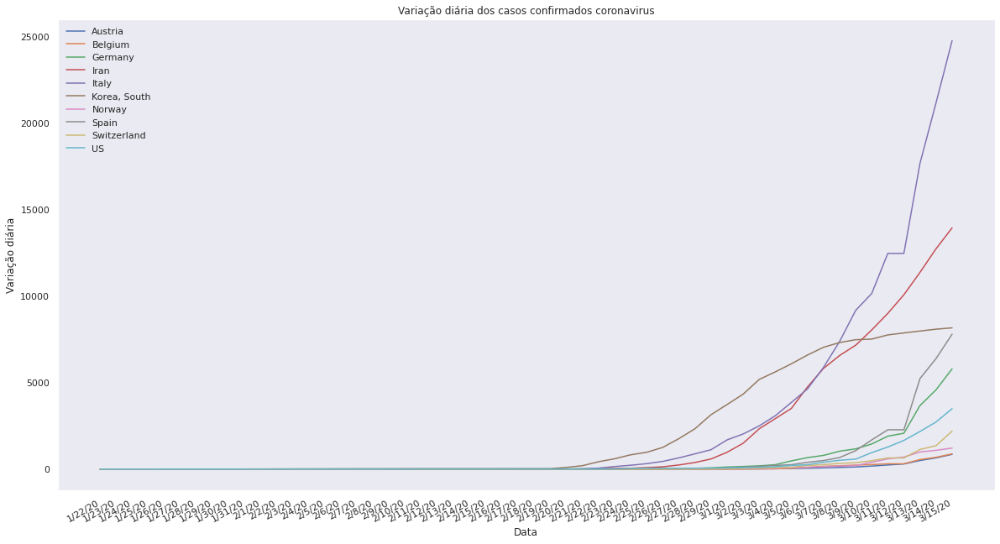

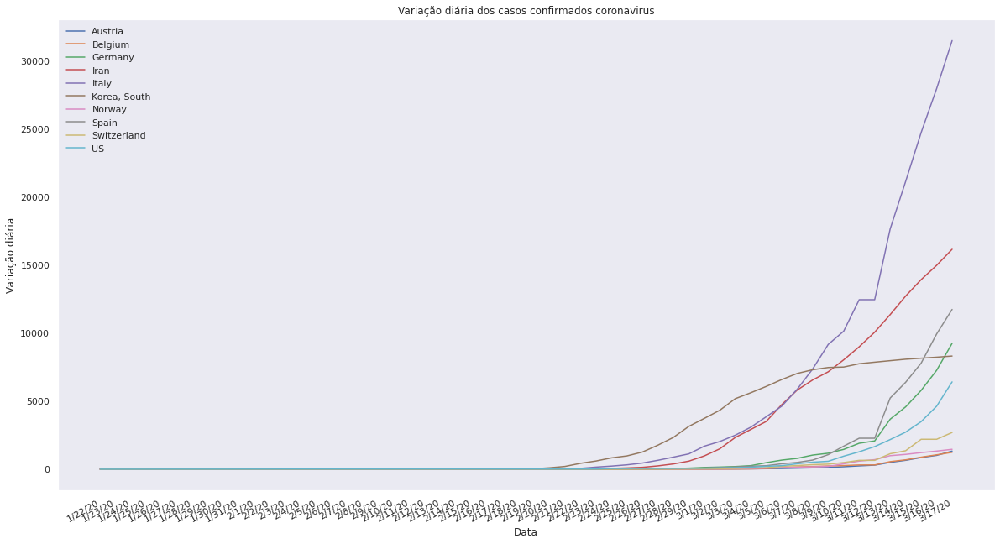

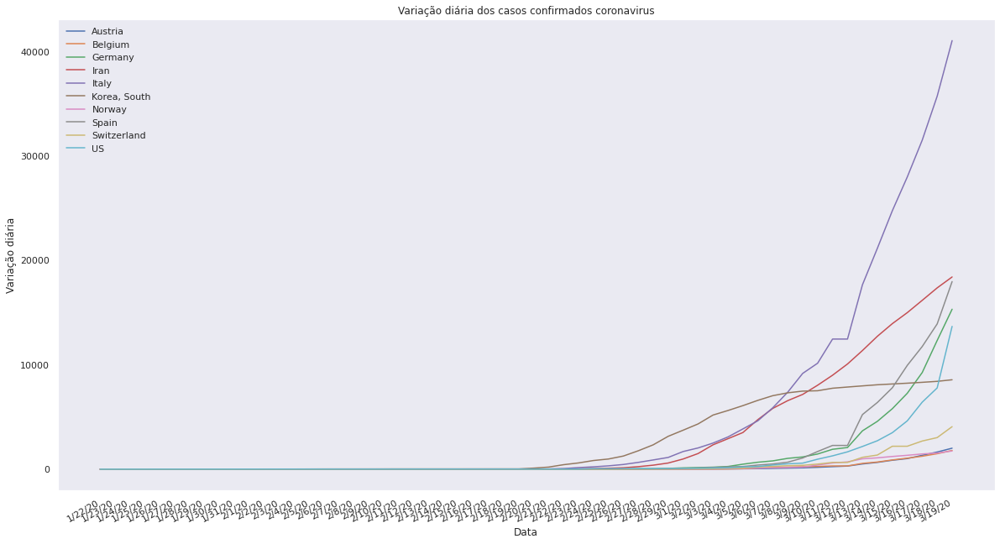

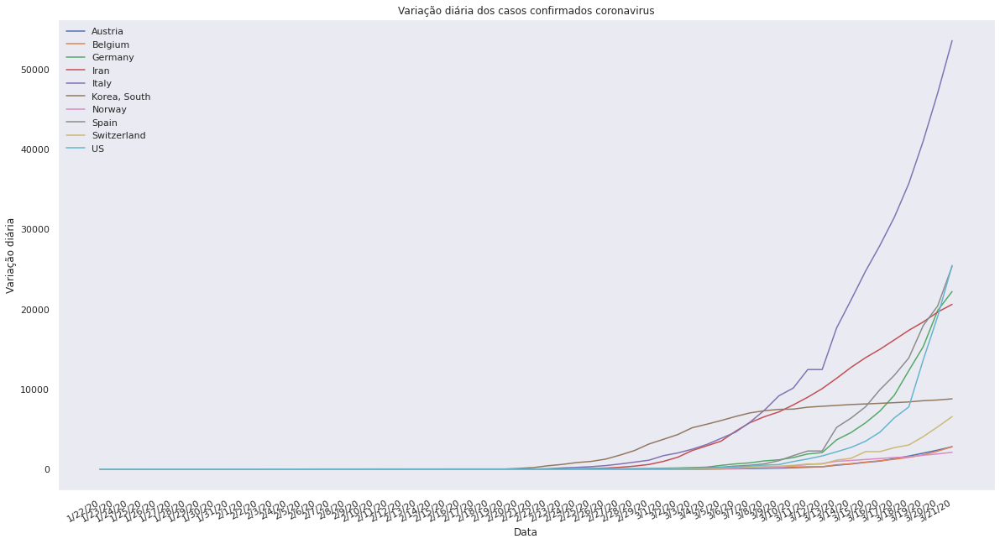

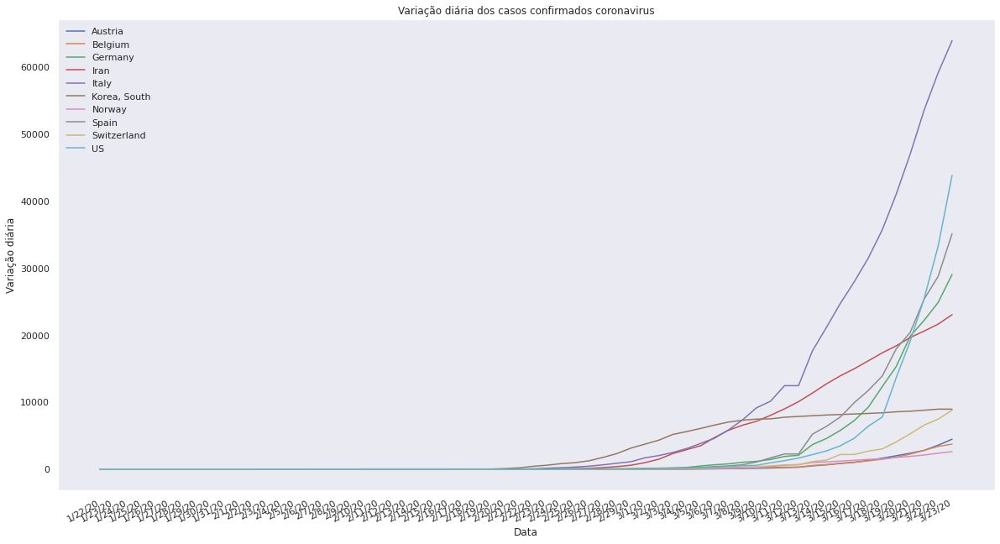

In [234]:
#Salvar os nomes dos arquivos no filepatch2 para chamar em ordem no GIF
filepath2 = []

#Salvar cada gráfico para cada data no dataframe, afim de montar o GIF mostrando a evolução em 2020
for i in range(0,evo_mundo.shape[1],2):
  teste = evo_mundo.iloc[:,0:i]
  teste2 = evo_mundo.iloc[:,range(0+i,len(evo_mundo.columns))]
  teste = teste.head(20)
  teste2 = teste2.head(20)
  teste2 = teste2.applymap(lambda x: np.nan)
  teste = teste.transpose()
  teste2 = teste2.transpose()
  teste3 = teste.append(teste2,sort=True)
  teste3 = teste3.transpose()
  teste4 = teste3.iloc[:,range(0,i)]
  teste4 = teste4.transpose()
  fig = plt.gcf()
  plt.rcParams["figure.figsize"] = (20,10)
  plt.plot(teste4, scalex=True, scaley=True)
  axes = plt.gca()
  axes.grid(which='both')
  axes.grid(which='minor', alpha=0.2, linestyle='--')
  plt.gcf().autofmt_xdate()
  axes.legend(teste4.columns,loc='upper left', frameon=False)
  plt.subplots_adjust(bottom= 0.2, top = 0.98)
  plt.title("Variação diária dos casos confirmados coronavirus")
  plt.ylabel("Variação diária")
  plt.xlabel("Data")
  plt.show()
  filepath = os.path.join(output_path, str(i)+'_indice.jpg')
  filepath2.append(os.path.join(output_path, str(i)+'_indice.jpg'))
  fig.savefig(filepath)

In [0]:
#Abrir os gráfico salvos e compactar para montar o GIF
frames = []
imgs = glob.glob("/content/drive/My Drive/Coronavirus/Evolucao_country/*.jpg")
for i in filepath2:
    new_frame = Image.open(i)
    frames.append(new_frame)

frames[0].save('/content/drive/My Drive/Coronavirus/Evolucao_country/jpg_to_gif.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=500, loop=0)

In [0]:
d1 = df_death.columns[4:df_death.shape[1]]
d2 = df_death.columns[1]
mergedlist = []
mergedlist.append(d2)
mergedlist.extend(d1)
evo_mundo = df_death.loc[:,mergedlist]
evo_mundo = evo_mundo.groupby('Country/Region')
evo_mundo = evo_mundo.first()
evo_mundo = evo_mundo.sort_values(df_death.iloc[:,df_death.shape[1]-1].name,ascending=False)
evo_mundo = evo_mundo.head(10)

In [0]:
#Salvar o caminho do diretório para salvar
output_path = '/content/drive/My Drive/Coronavirus/Evolucao_country_mortes'

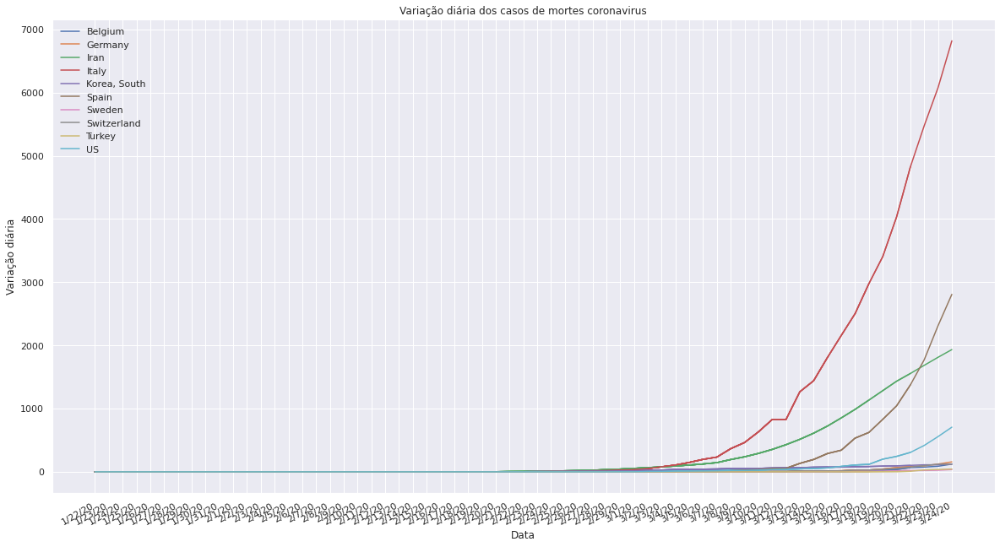

In [175]:
#Salvar cada gráfico para cada data no dataframe, afim de montar o GIF mostrando a evolução em 2020
for i in range(0,evo_mundo.shape[1],3):
  teste = evo_mundo.iloc[:,0:i]
  teste2 = evo_mundo.iloc[:,range(0+i,len(evo_mundo.columns))]
  teste = teste.head(20)
  teste2 = teste2.head(20)
  teste2 = teste2.applymap(lambda x: np.nan)
  teste = teste.transpose()
  teste2 = teste2.transpose()
  teste3 = teste.append(teste2,sort=True)
  teste3 = teste3.transpose()
  teste4 = teste3.iloc[:,range(0,i)]
  teste4 = teste4.transpose()
  fig = plt.gcf()
  plt.plot(teste4, scalex=True, scaley=True)
  axes = plt.gca()
  axes.grid(which='both')
  axes.grid(which='minor', alpha=0.2, linestyle='--')
  plt.gcf().autofmt_xdate()
  axes.legend(teste4.columns,loc='upper left', frameon=False)
  plt.subplots_adjust(bottom= 0.2, top = 0.98)
  plt.title("Variação diária dos casos de mortes coronavirus")
  plt.ylabel("Variação diária")
  plt.xlabel("Data")
  #plt.show()
  filepath = os.path.join(output_path, str(i)+'_indice.jpg')
  fig.savefig(filepath)

In [0]:
#Abrir os gráfico salvos e compactar para montar o GIF
frames = []
imgs = glob.glob("/content/drive/My Drive/Coronavirus/Evolucao_country_mortes/*.jpg")
for i in imgs:
    new_frame = Image.open(i)
    frames.append(new_frame)

frames[0].save('/content/drive/My Drive/Coronavirus/Evolucao_country_mortes/jpg_to_gif.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=500, loop=0)

## Evolução por dia de epidemia

In [0]:
d1 = df_confd.columns[4:df_confd.shape[1]]
d2 = df_confd.columns[1]
mergedlist = []
mergedlist.append(d2)
mergedlist.extend(d1)
evo_mundo = df_confd.loc[:,mergedlist]
evo_mundo = evo_mundo.groupby('Country/Region')
evo_mundo = evo_mundo.first()
evo_mundo = evo_mundo.sort_values(df_confd.iloc[:,df_confd.shape[1]-1].name,ascending=False)
evo_mundo = evo_mundo.head(12)
#evo_mundo = evo_mundo.drop('China', axis = 0)
i = 0
d_zero = evo_mundo.iloc[i,:]
d_zero = d_zero[d_zero!=0]
d_zero = pd.DataFrame({'Country/Region': evo_mundo.index[i], "Casos": d_zero})
d_zero['dias'] = np.arange(1,len(d_zero)+1)
d_zero2 = d_zero
for i in range(1,len(evo_mundo)):
  evo_mundo.iloc[i,:]
  d_zero = evo_mundo.iloc[i,:]
  d_zero = d_zero[d_zero!=0]
  d_zero = pd.DataFrame({'Country/Region': evo_mundo.index[i], "Casos": d_zero})
  d_zero['dias'] = np.arange(1,len(d_zero)+1)
  d_zero2 = d_zero2.append(d_zero)
d_zero2 = d_zero2.pivot_table(index=['Country/Region'],columns='dias',values='Casos',fill_value=0)
d_zero2 = d_zero2.replace(0,np.nan)

In [0]:
colors = {'Austria':'red', 'Belgium':'blue', 'Brazil':'green', 'Germany':'black',
          'Iran':'cyan','Italy':'indigo','Korea, South':'gold','Norway':'magenta','Portugal':'pink','Spain':'brown',
          'Switzerland':'peru','US':'silver'}

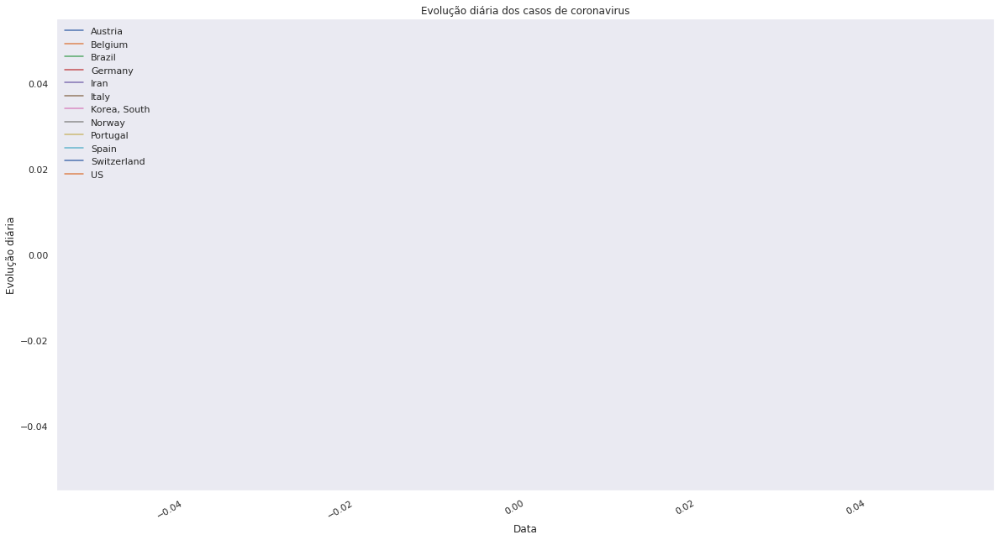

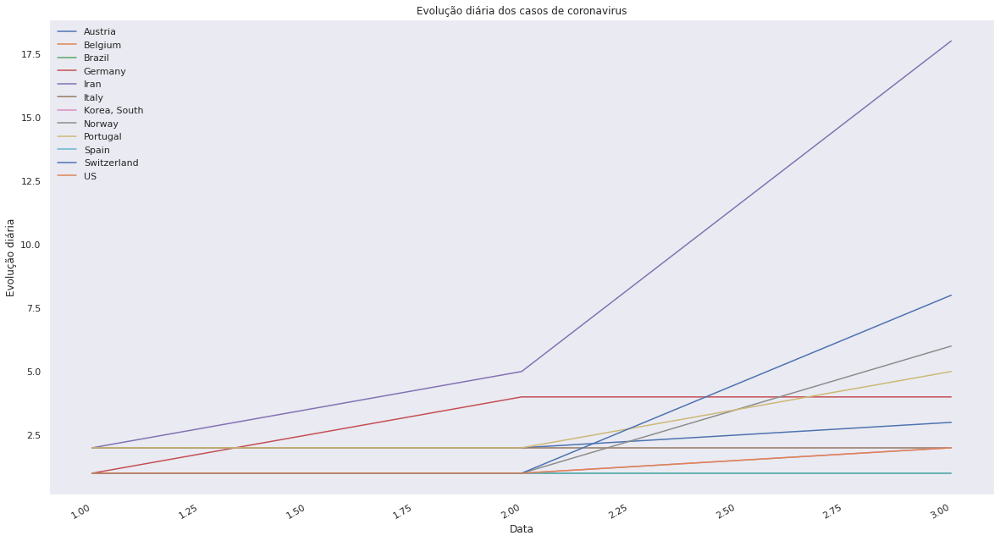

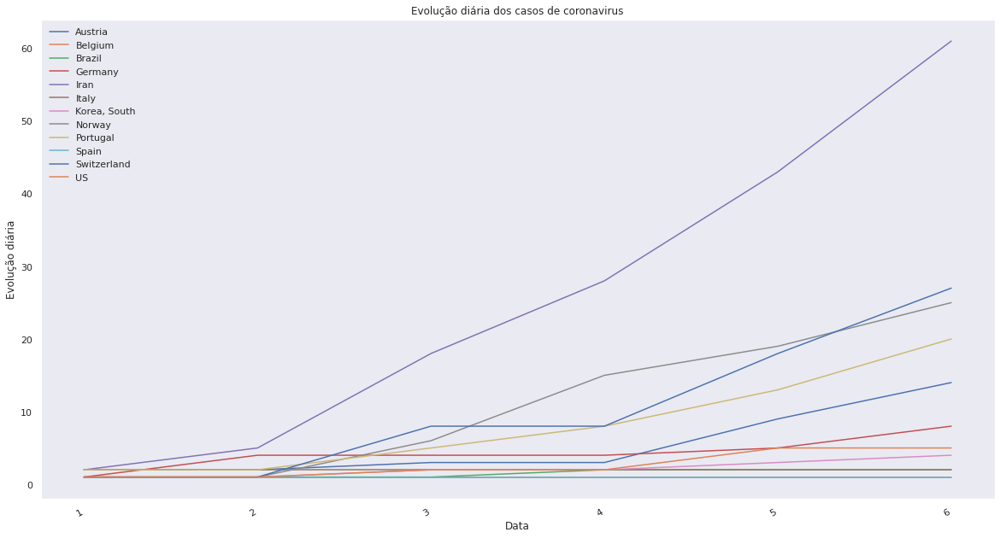

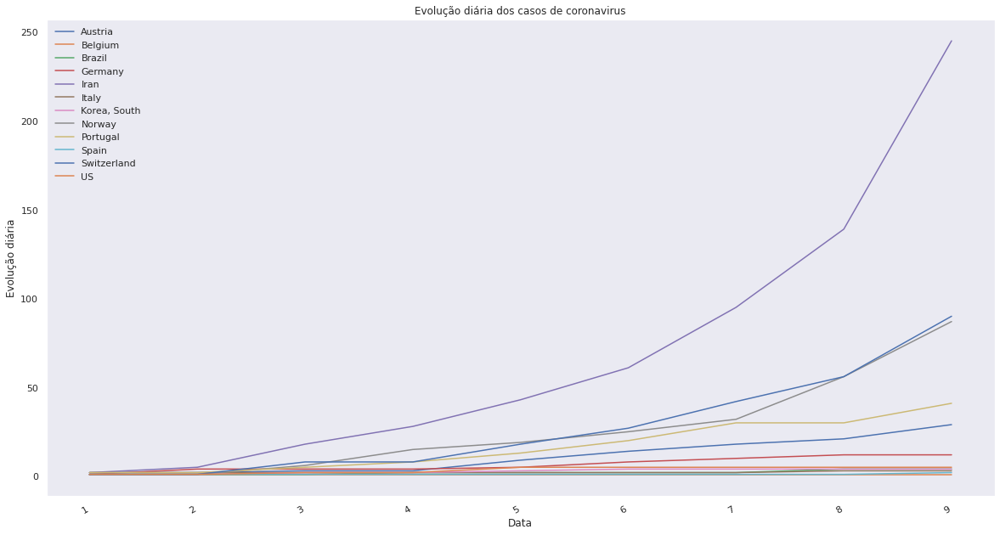

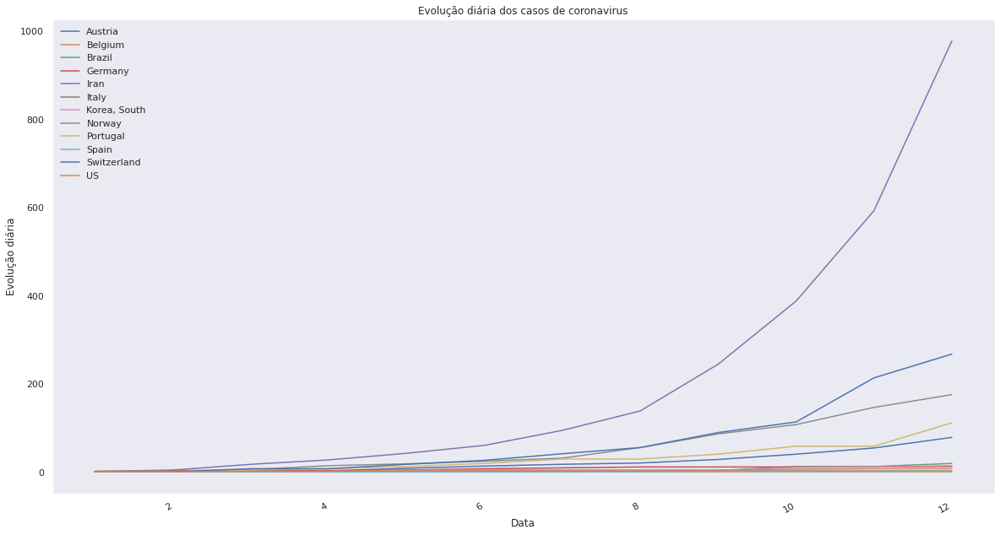

...

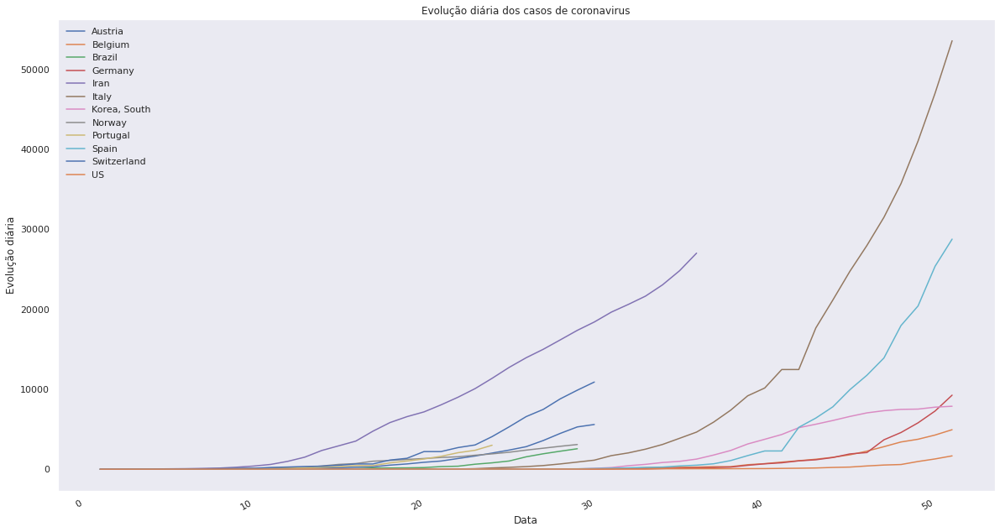

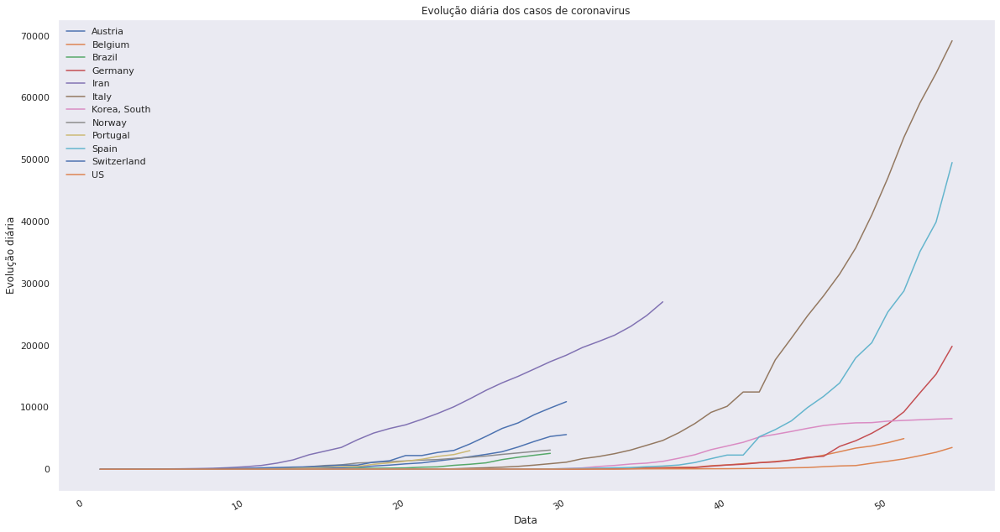

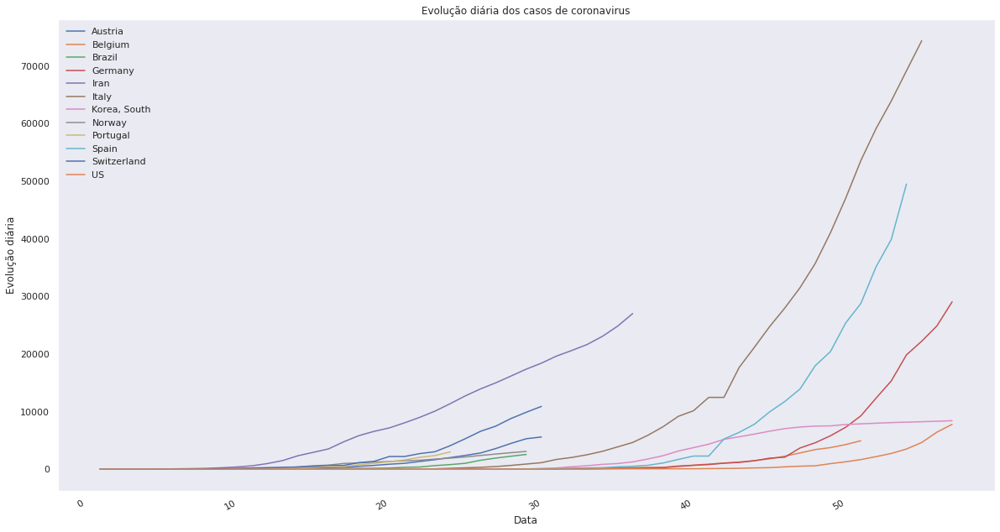

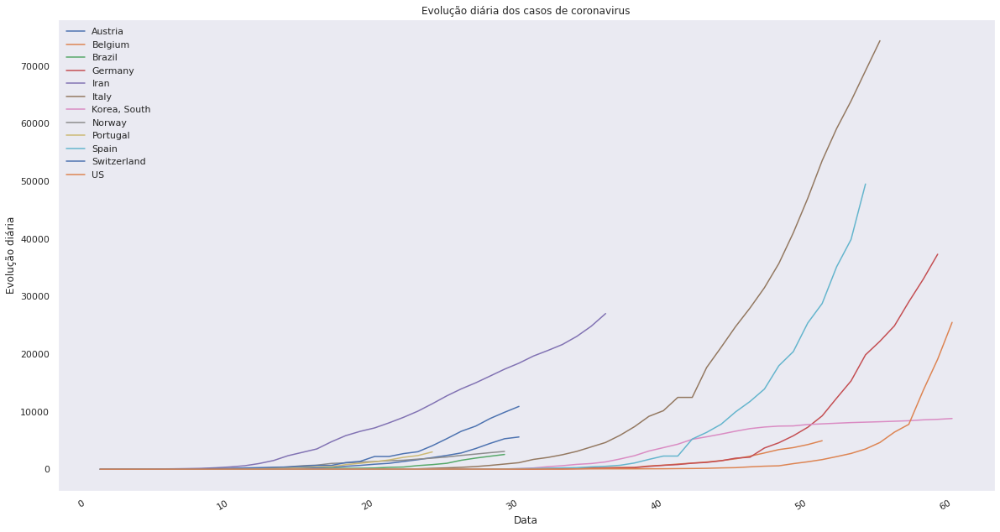

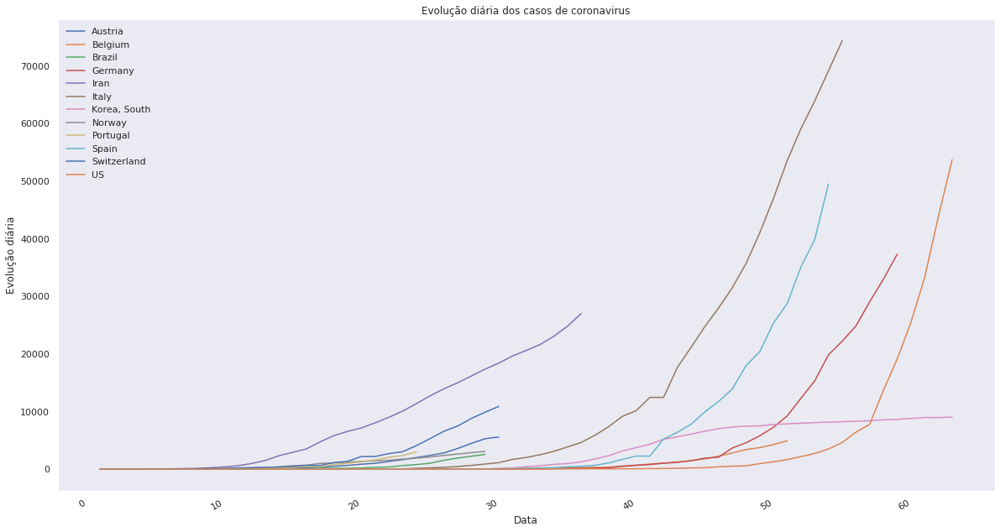

In [213]:
#Salvar o caminho do diretório para salvar
output_path = '/content/drive/My Drive/Coronavirus/dias_evolucao'

#Salvar cada gráfico para cada data no dataframe, afim de montar o GIF mostrando a evolução em 2020
for i in range(0,d_zero2.shape[1],3):
  teste4 = d_zero2.iloc[:,range(0,i)]
  teste4 = teste4.transpose()
  fig = plt.gcf()
  plt.plot(teste4, scalex=True, scaley=True)
  axes = plt.gca()
  axes.grid(which='both')
  axes.grid(which='minor', alpha=0.2, linestyle='--')
  plt.gcf().autofmt_xdate()
  axes.legend(teste4.columns,loc='upper left', frameon=False)
  plt.subplots_adjust(bottom= 0.2, top = 0.98)
  plt.title("Evolução diária dos casos de coronavirus")
  plt.ylabel("Evolução diária")
  plt.xlabel("Data")
  plt.show()
  filepath = os.path.join(output_path, str(i)+'_indice.jpg')
  fig.savefig(filepath)

In [0]:
#Abrir os gráfico salvos e compactar para montar o GIF
frames = []
imgs = glob.glob("/content/drive/My Drive/Coronavirus/dias_evolucao/*.jpg")
for i in imgs:
    new_frame = Image.open(i)
    frames.append(new_frame)

frames[0].save('/content/drive/My Drive/Coronavirus/dias_evolucao/jpg_to_gif.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=500, loop=0)

In [0]:
d1 = df_death.columns[4:df_death.shape[1]]
d2 = df_death.columns[1]
mergedlist = []
mergedlist.append(d2)
mergedlist.extend(d1)
evo_mundo = df_death.loc[:,mergedlist]
evo_mundo = evo_mundo.groupby('Country/Region')
evo_mundo = evo_mundo.first()
evo_mundo = evo_mundo.sort_values(df_death.iloc[:,df_death.shape[1]-1].name,ascending=False)
evo_mundo = evo_mundo.head(15)
evo_mundo = evo_mundo.drop('China', axis = 0)
i = 0
d_zero = evo_mundo.iloc[i,:]
d_zero = d_zero[d_zero!=0]
d_zero = pd.DataFrame({'Country/Region': evo_mundo.index[i], "Casos": d_zero})
d_zero['dias'] = np.arange(1,len(d_zero)+1)
d_zero2 = d_zero
for i in range(1,len(evo_mundo)):
  evo_mundo.iloc[i,:]
  d_zero = evo_mundo.iloc[i,:]
  d_zero = d_zero[d_zero!=0]
  d_zero = pd.DataFrame({'Country/Region': evo_mundo.index[i], "Casos": d_zero})
  d_zero['dias'] = np.arange(1,len(d_zero)+1)
  d_zero2 = d_zero2.append(d_zero)
d_zero2 = d_zero2.pivot_table(index=['Country/Region'],columns='dias',values='Casos',fill_value=0)
d_zero2 = d_zero2.replace(0,np.nan)

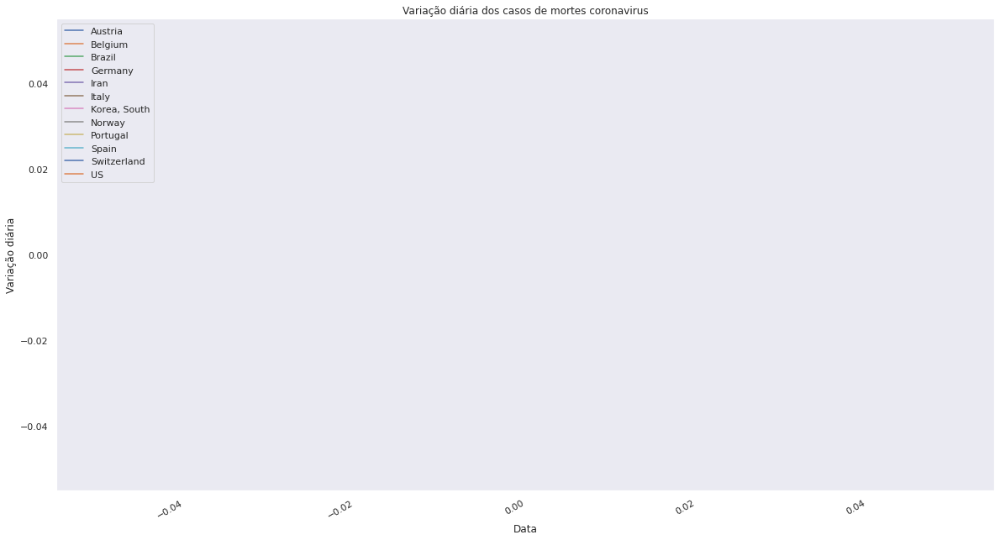

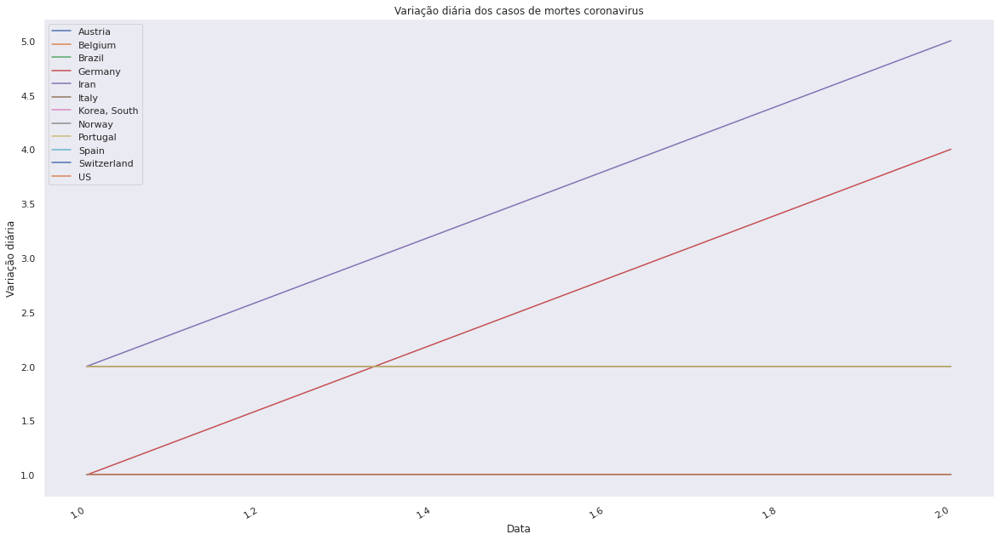

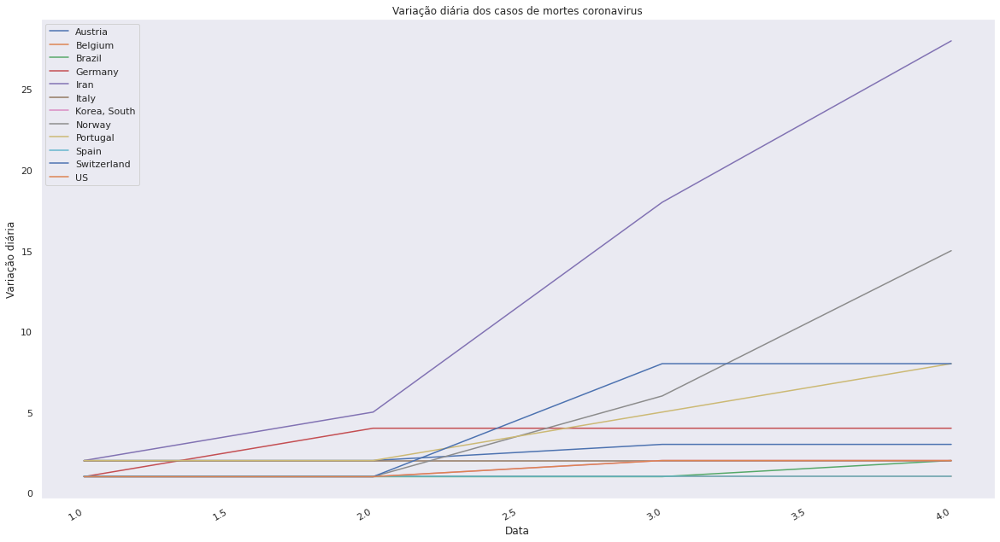

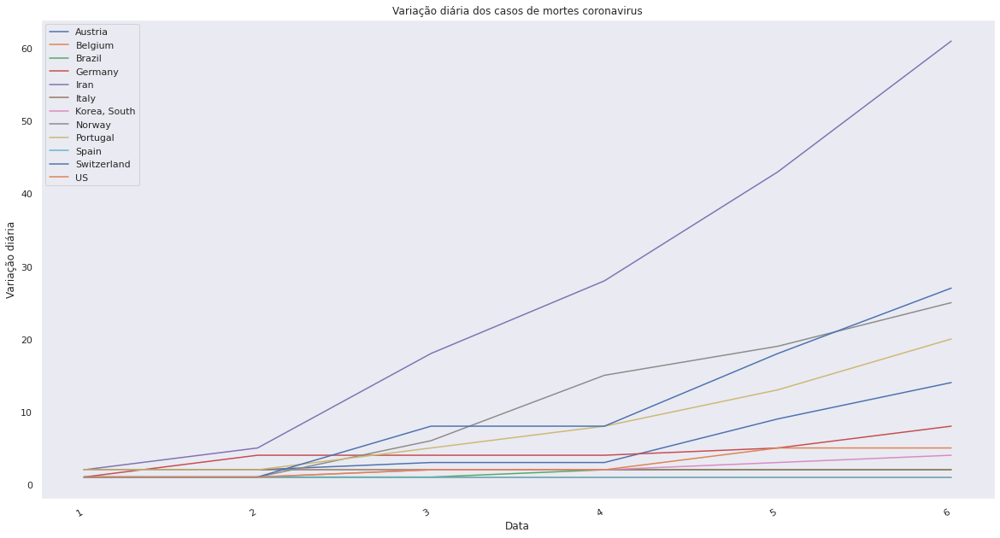

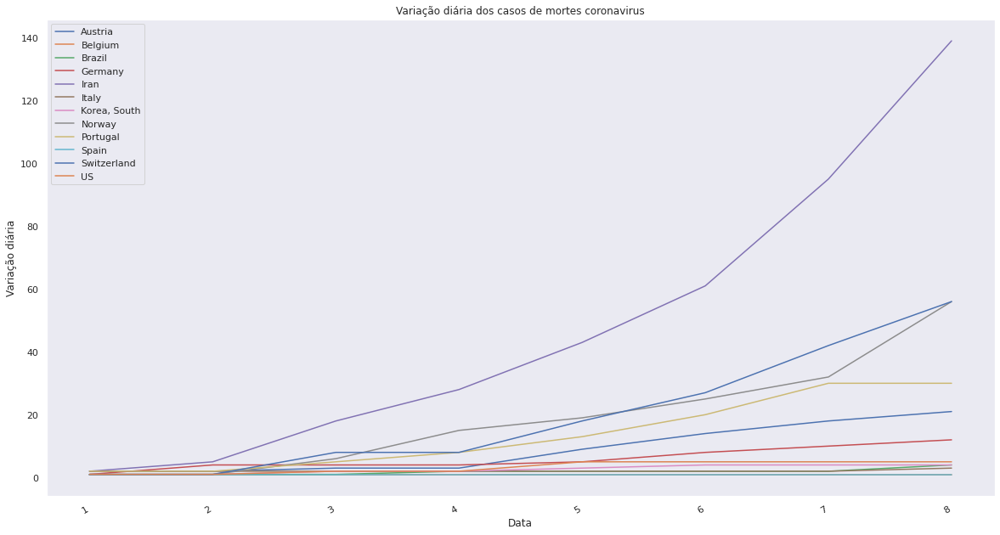

...

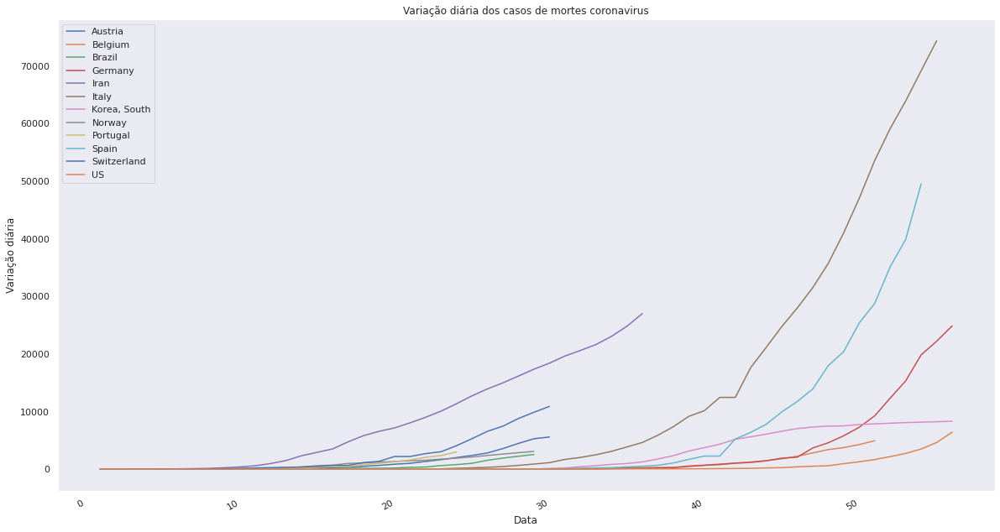

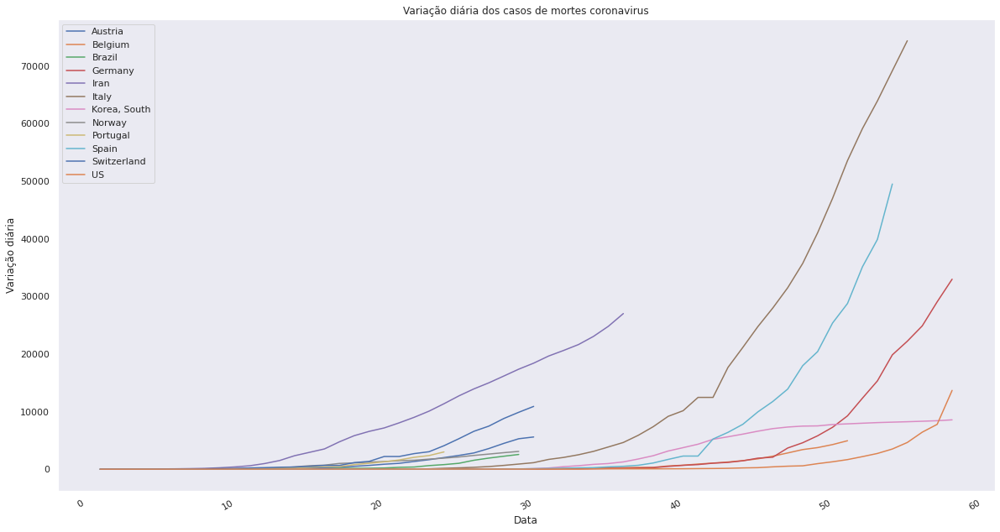

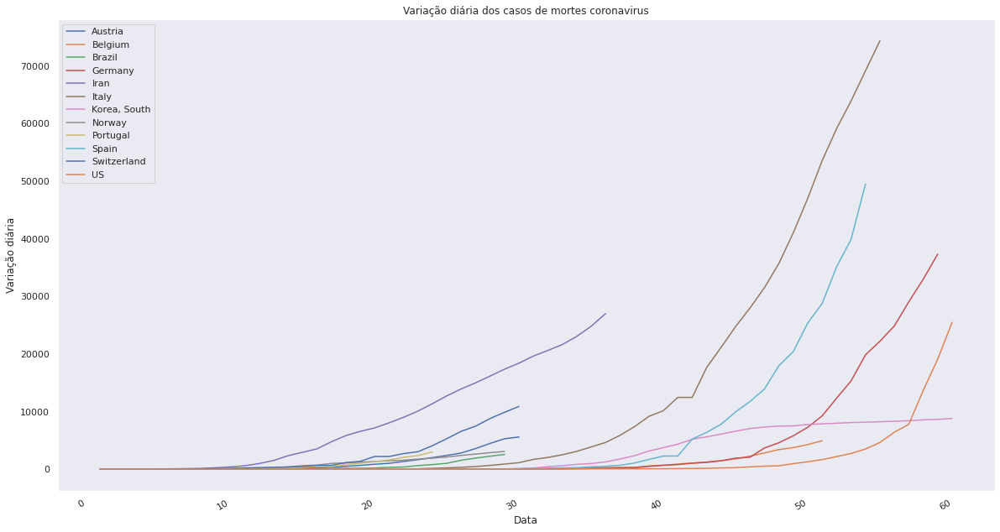

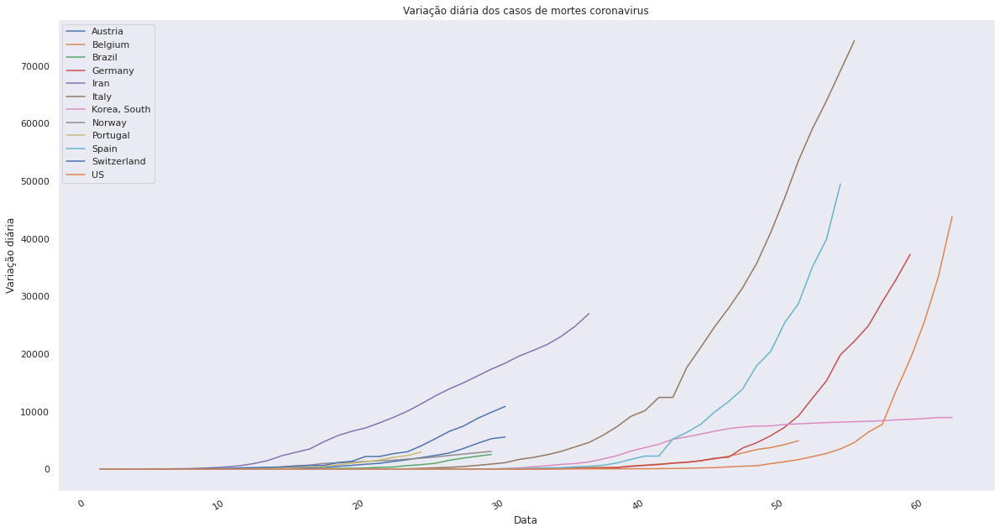

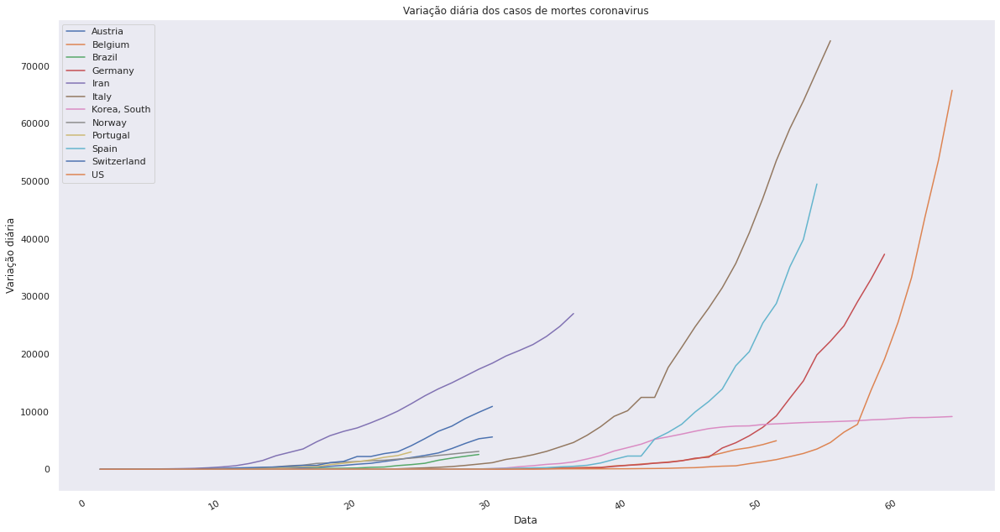

In [217]:
#Salvar os nomes dos arquivos no filepatch2 para chamar em ordem no GIF
filepath2 = []
#Salvar o caminho do diretório para salvar
output_path = '/content/drive/My Drive/Coronavirus/dias_evolucao_mortes'
#Salvar cada gráfico para cada data no dataframe, afim de montar o GIF mostrando a evolução em 2020
for i in range(0,d_zero2.shape[1],2):
  teste4 = d_zero2.iloc[:,range(0,i)]
  teste4 = teste4.transpose()
  fig = plt.gcf()
  plt.plot(teste4, scalex=True, scaley=True)
  axes = plt.gca()
  axes.grid(which='both')
  axes.grid(which='minor', alpha=0.2, linestyle='--')
  plt.gcf().autofmt_xdate()
  axes.legend(teste4.columns,loc='upper left', frameon=True)
  plt.subplots_adjust(bottom= 0.2, top = 0.98)
  plt.title("Variação diária dos casos de mortes coronavirus")
  plt.ylabel("Variação diária")
  plt.xlabel("Data")
  plt.show()
  filepath = os.path.join(output_path, str(i)+'_indice.jpg')
  filepath2.append(os.path.join(output_path, str(i)+'_indice.jpg'))
  fig.savefig(filepath)

In [0]:
#Abrir os gráfico salvos e compactar para montar o GIF
frames = []
imgs = glob.glob("/content/drive/My Drive/Coronavirus/dias_evolucao/*.jpg")
for i in filepath2:
    new_frame = Image.open(i)
    frames.append(new_frame)

frames[0].save('/content/drive/My Drive/Coronavirus/dias_evolucao/jpg_to_gif.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=500, loop=0)

# Curva de crescimento

In [0]:
d1 = df_confd.columns[4:df_confd.shape[1]]
d2 = df_confd.columns[1]
mergedlist = []
mergedlist.append(d2)
mergedlist.extend(d1)
evo_mundo = df_confd.loc[:,mergedlist]
evo_mundo = evo_mundo.groupby('Country/Region')
evo_mundo = evo_mundo.first()
evo_mundo = evo_mundo.sort_values(df_confd.iloc[:,df_confd.shape[1]-1].name,ascending=False)
evo_mundo = evo_mundo.head(15)
#evo_mundo = evo_mundo.drop('China', axis = 0)
i = 0
d_zero = evo_mundo.iloc[i,:]
d_zero = d_zero[d_zero!=0]
d_zero = pd.DataFrame({'Country/Region': evo_mundo.index[i], "Casos": d_zero})
d_zero['dias'] = np.arange(1,len(d_zero)+1)
d_zero2 = d_zero
for i in range(1,len(evo_mundo)):
  evo_mundo.iloc[i,:]
  d_zero = evo_mundo.iloc[i,:]
  d_zero = d_zero[d_zero!=0]
  d_zero = pd.DataFrame({'Country/Region': evo_mundo.index[i], "Casos": d_zero})
  d_zero['dias'] = np.arange(1,len(d_zero)+1)
  d_zero2 = d_zero2.append(d_zero)
d_zero2 = d_zero2.pivot_table(index=['Country/Region'],columns='dias',values='Casos',fill_value=0)
d_zero2 = d_zero2.replace(0,np.nan)

In [0]:
modelo = d_zero2.iloc[2,:]
modelo = modelo.dropna(axis=0)
dias = modelo.index[0:len(modelo)]

In [0]:
#Funções
import scipy 
from scipy.special import gamma 
CUSTOM_FUNCTIONS = {} 
   
log2 = np.log(2) 
pi = np.pi 

"gaussian function: wid = half-width at half-max" 
def gauss(x, amp, cen, wid): 
  return amp * np.exp(-log2 * (x-cen) **2 / wid**2) 

"lorenztian function: wid = half-width at half-max" 
def loren(x, amp, cen, wid):
  return (amp  / (1 + ((x-cen)/wid)**2)) 

"scaled gaussian function: wid = half-width at half-max"    
def gauss_area(x, amp, cen, wid): 
  return np.sqrt(log2/pi) * gauss(x, amp, cen, wid) / wid 
   
"scaled lorenztian function: wid = half-width at half-max" 
def loren_area(x, amp, cen, wid): 
  return loren(x, amp, cen, wid) / (pi*wid) 
   
    
"""pseudo-voigt function: (1-frac)*gauss(amp, cen, wid) + frac*loren(amp, cen, wid)""" 
def pvoigt(x, amp, cen, wid, frac): 
  return amp * (gauss(x, (1-frac), cen, wid) + loren(x, frac, cen, wid)) 


"""scaled pseudo-voigt function: (1-frac)*gauss_area(amp, cen, wid) + frac*loren_are(amp, cen, wid)"""
def pvoigt_area(x, amp, cen, wid, frac):     
  return amp * (gauss_area(x, (1-frac), cen, wid) + loren_area(x, frac,     cen, wid)) 

"""pearson peak function """    
def pearson7(x, amp, cen, wid, expon): 
  xp = 1.0 * expon 
  return amp / (1 + ( ((x-cen)/wid)**2) * (2**(1/xp) -1) )**xp  
   
"""scaled pearson peak function """ 
def pearson7_area(x, amp, cen, wid, expon): 
    xp = 1.0 * expon 
    scale = gamma(xp) * sqrt((2**(1/xp) - 1)) / (gamma(xp-0.5)) 
    return scale * pearson7(x, amp, cen, wid, xp) / (wid*sqrt(pi)) 
   
    return scale * pearson7(x, amp, cen, sigma, expon) / (sigma*sqrt(pi)) 
   
CUSTOM_FUNCTIONS = {'gauss': gauss, 'gauss_area': gauss_area, 
                      'loren': loren, 'loren_area': loren_area, 
                      'pvoigt': pvoigt, 'pvoigt_area': pvoigt_area, 
                      'pearson7': pearson7, 'pearson7_area': pearson7_area} 

In [228]:
x = dias
y = modelo

x2 = dias
y2 = modelo

z = pd.Series(range(max(x)+1,max(x)+67))
z = pd.DataFrame(z)
z = z.set_index(z.iloc[:,0])
z = x.append(z.index)

init_vals = [1, 0, 1]

init_vals2 = [1, 0, 1, 0]

best_vals, covar = curve_fit(gaussian, x, y, p0=init_vals,maxfev=500000)

best_vals2, covar2 = curve_fit(pearson7, x, y, p0=init_vals2,maxfev=500000)

best_vals3, covar3 = curve_fit(loren, x, y, p0=init_vals,maxfev=500000)

best_vals4, covar4 = curve_fit(pvoigt, x, y, p0=init_vals2,maxfev=500000)

predict2 = gaussian(z, *best_vals)
#x3 = predict2.index
y3 = predict2

predict3 = pearson7(z, *best_vals2)
#x4 = predict3.index
y4 = predict3

predict4 = loren(z, *best_vals3)
#x4 = predict3.index
y5 = predict4

predict5 = pvoigt(z, *best_vals4)
#x4 = predict3.index
y6 = predict5

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: divide by zero encountered in double_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: overflow encountered in double_scalars
/usr/local/lib/python3.6/dist-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


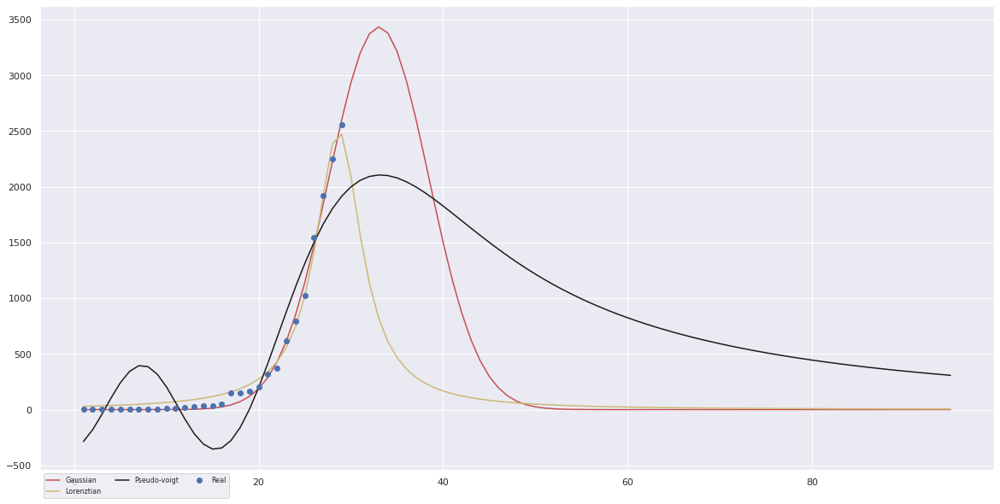

In [230]:
teste6 = pd.DataFrame({'Dia':z, 'Corona1': y3, 'Corona2':y4, 'Corona3':y5, 'Corona4':y6})
plt.plot(teste6['Dia'],teste6['Corona1'],'-r', label='Gaussian')
#plt.plot(teste6['Dia'],teste6['Corona2'],'-g', label='Pearson7')
plt.plot(teste6['Dia'],teste6['Corona3'],'-y', label='Lorenztian')
plt.plot(teste6['Dia'],teste6['Corona4'],'-k', label='Pseudo-voigt')
plt.plot(x,y,'bo', label='Real')
plt.legend(loc='upper left', numpoints=1, ncol=3, fontsize=8, bbox_to_anchor=(0, 0))
plt.show()

[[Model]]
    Model(gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 104
    # data points      = 29
    # variables        = 3
    chi-square         = 59087.8781
    reduced chi-square = 2272.61070
    Akaike info crit   = 226.965072
    Bayesian info crit = 231.066960
[[Variables]]
    amp:  46587.0259 +/- 8170.45566 (17.54%) (init = 5)
    cen:  33.0368726 +/- 0.97682321 (2.96%) (init = 1)
    wid:  5.41065669 +/- 0.38224239 (7.06%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(amp, cen) =  0.998
    C(cen, wid) =  0.983
    C(amp, wid) =  0.978


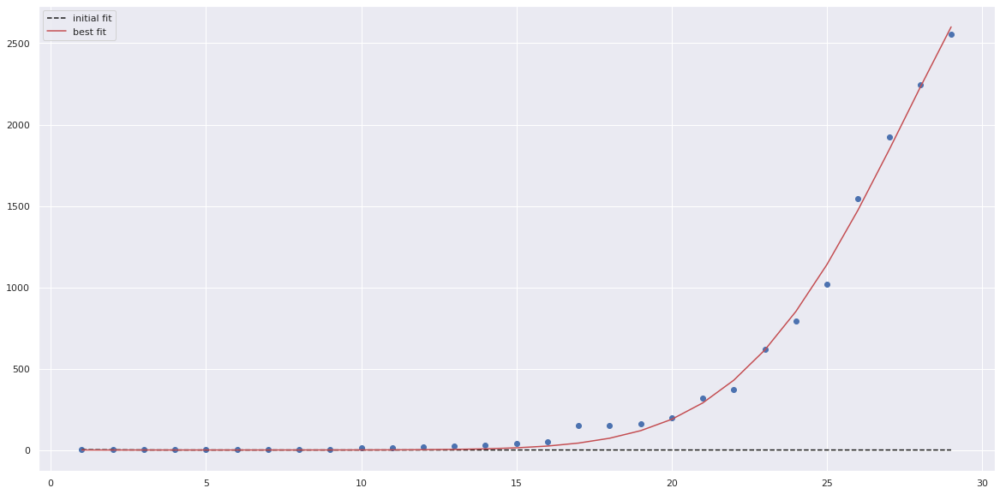

In [227]:
from scipy.optimize import curve_fit
from numpy import exp, loadtxt, pi, sqrt
from lmfit import Model

x = dias
y = modelo


def gaussian(x, amp, cen, wid):
    """1-d gaussian: gaussian(x, amp, cen, wid)"""
    return (amp / (sqrt(2*pi) * wid)) * exp(-(x-cen)**2 / (2*wid**2))

    
def gaussian2(x, amp, cen, wid):
    return amp * exp(-(x-cen)**2 /wid)

gmodel = Model(gaussian)
result = gmodel.fit(y, x=x, amp=5, cen=1, wid=1)

print(result.fit_report())

plt.plot(x, y, 'bo')
plt.plot(x, result.init_fit, 'k--', label='initial fit')
plt.plot(x, result.best_fit, 'r-', label='best fit')
plt.legend(loc='best')
plt.show()

[[Model]]
    Model(gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 80
    # data points      = 28
    # variables        = 3
    chi-square         = 64471.7469
    reduced chi-square = 2578.86988
    Akaike info crit   = 222.769780
    Bayesian info crit = 226.766394
[[Variables]]
    amp:  60620.9573 +/- 5041.99122 (8.32%) (init = 5)
    cen:  31.0985206 +/- 0.57567324 (1.85%) (init = 1)
    wid:  6.37201957 +/- 0.26237689 (4.12%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(amp, cen) =  0.996
    C(cen, wid) =  0.972
    C(amp, wid) =  0.972


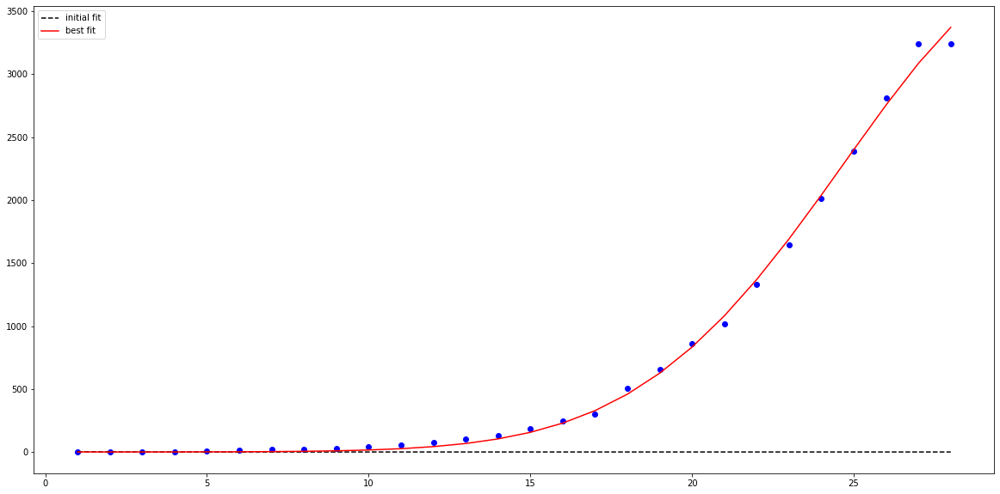

In [0]:
from scipy.optimize import curve_fit
from numpy import exp, loadtxt, pi, sqrt
from lmfit import Model

def gaussian(x, amp, cen, wid):
    """1-d gaussian: gaussian(x, amp, cen, wid)"""
    return (amp / (sqrt(2*pi) * wid)) * exp(-(x-cen)**2 / (2*wid**2))


gmodel = Model(gaussian)
result1 = gmodel.fit(y, x=x, amp=5, cen=1, wid=1)

print(result1.fit_report())

plt.plot(x, y, 'bo')
plt.plot(x, result1.init_fit, 'k--', label='initial fit')
plt.plot(x, result1.best_fit, 'r-', label='best fit')
plt.legend(loc='best')
plt.show()

[[Model]]
    Model(skewed_gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 116
    # data points      = 28
    # variables        = 4
    chi-square         = 64471.7469
    reduced chi-square = 2686.32279
    Akaike info crit   = 224.769780
    Bayesian info crit = 230.098598
##  Warning: uncertainties could not be estimated:
[[Variables]]
    amplitude:  30310.4623 (init = 10)
    center:     31.0985169 (init = 0)
    sigma:      6.37201765 (init = 1)
    gamma:     -760.449469 (init = 0)
    height:     1897.69179 == '0.3989423*amplitude/max(2.220446049250313e-16, sigma)'
    fwhm:       15.0049546 == '2.3548200*sigma'


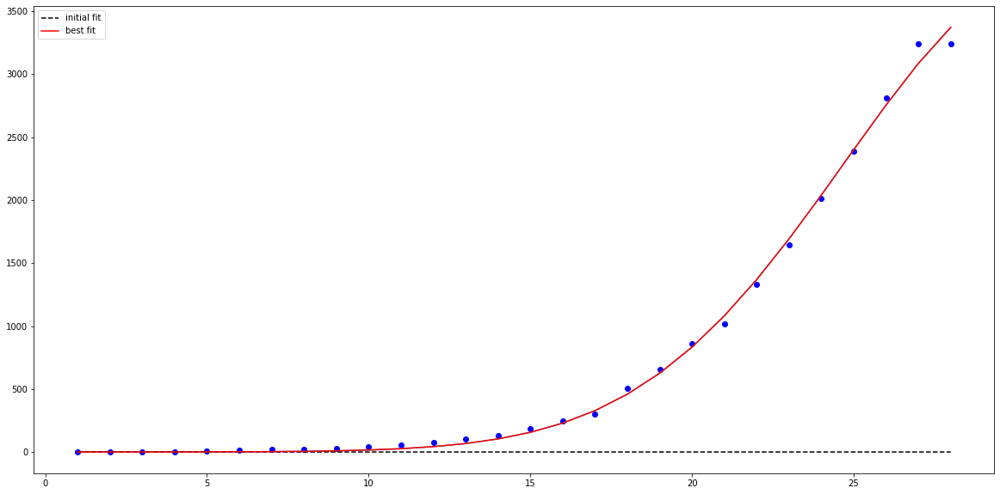

In [0]:
from lmfit.models import SkewedGaussianModel

model = SkewedGaussianModel()

# set initial parameter values
params = model.make_params(amplitude=10, center=0, sigma=1, gamma=0)

# adjust parameters  to best fit data.
result2 = model.fit(y, params, x=x)

print(result2.fit_report())
plt.plot(x, y, 'bo')
plt.plot(x, result2.best_fit) 
plt.plot(x, result1.init_fit, 'k--', label='initial fit')
plt.plot(x, result1.best_fit, 'r-', label='best fit')
plt.legend(loc='best')
plt.show()

[[Model]]
    (Model(gaussian) + Model(line))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 45
    # data points      = 29
    # variables        = 5
    chi-square         = 6048804.36
    reduced chi-square = 252033.515
    Akaike info crit   = 365.194185
    Bayesian info crit = 372.030664
##  Warning: uncertainties could not be estimated:
[[Variables]]
    amp:        7232.82669 (init = 5)
    cen:        162.850806 (init = 5)
    wid:       -6.77327668 (init = 1)
    slope:      65.9783254 (init = 0)
    intercept: -566.433502 (init = 1)


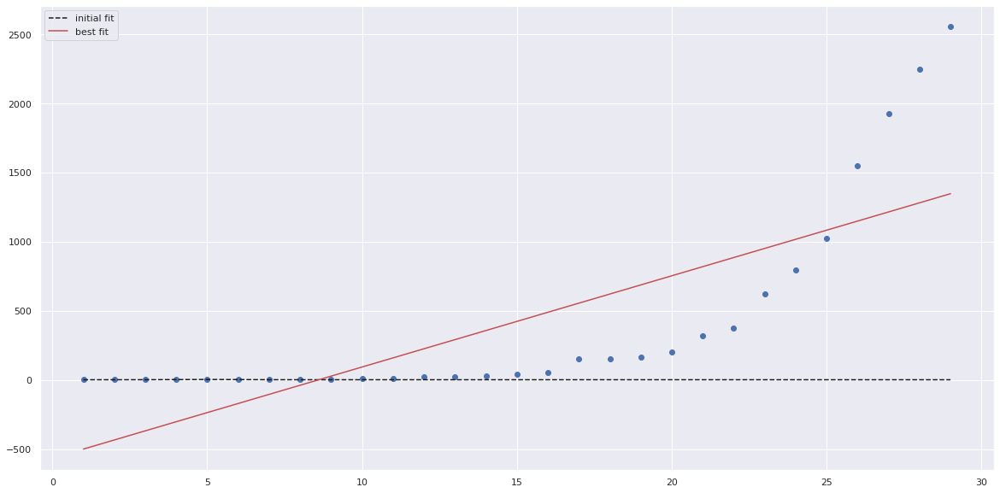

In [231]:
#Teste em considerar modelos lineares com não linear
from scipy.optimize import curve_fit
from numpy import exp, loadtxt, pi, sqrt
from lmfit import Model

x = dias
y = modelo


def gaussian(x, amp, cen, wid):
    """1-d gaussian: gaussian(x, amp, cen, wid)"""
    return (amp / (sqrt(2*pi) * wid)) * exp(-(x-cen)**2 / (2*wid**2))

    
def line(x, slope, intercept):
    """a line"""
    return slope*x + intercept


mod = Model(gaussian) + Model(line)
pars = mod.make_params(amp=5, cen=5, wid=1, slope=0, intercept=1)

result = mod.fit(y, pars, x=x)

print(result.fit_report())

plt.plot(x, y, 'bo')
plt.plot(x, result.init_fit, 'k--', label='initial fit')
plt.plot(x, result.best_fit, 'r-', label='best fit')
plt.legend(loc='best')
plt.show()